In [1]:
#####################################################################################
#################### Loading Julia files needed ##  ###################################
#####################################################################################
################# preamble.jl contains all the packages necessary in this simulation.
include("./mytools/preamble.jl") 
##########################################################################################################################################
######### scenario.jl contains information on TX and RX position,
######### their features (VerticalDipole and GroundSampler respectively),
######### geomagnetic field, altitude, initial and final time, etc. ######################################################################################
include("./mytools/scenario.jl")
import CairoMakie
const CM = CairoMakie
using Optim
using LinearAlgebra  
using Polynomials
using GMT
using Dates
#using SavitzkyGolay, Statistics
##################################################################
using Interpolations: interpolate, extrapolate, Gridded, Linear, Line
using SavitzkyGolay
##################################################################
#unique(FIRI.HEADER.f10_7)
#FIRI.HEADER[1960:1980]
#ALT_KM = FIRI.ALTITUDE/1e3

[ Info: Loading CHAOS-7.11.mat


Geodesic Distance from WWVB to PLO: 6568.28 km
Geodesic Distance from WWVB to PIU: 5659.0 km
Geodesic Distance from NAA to PLO: 6568.28 km
Geodesic Distance from NAA to PIU: 5659.0 km
Initial time: 2008-01-10T10:00:00+00:00
Scenario defined.
Datetime range: from 2008-01-10 10:00:00 UTC to 2008-01-11 10:00:00 UTC with a length of 289.


In [2]:
##################################################################
function GetParams(initial_guess, firi_prof,alt_aux)
    ff(x) = obj_func(x[1],x[2],firi_prof,alt_aux)
    options = Optim.Options(iterations=10000)
    result = optimize(ff,initial_guess,options)
    h_reco = Optim.minimizer(result)[1]
    β_reco = Optim.minimizer(result)[2]
    reco_prof = waitprofile.(alt_aux,h_reco,β_reco)
    chi2_value = sum((reco_prof .- firi_prof).^ 2)
    return h_reco, β_reco, chi2_value 
end

####################################################################
function reflectionheight_v2(   ne_prof::AbstractVector{<:Real},
                                tol::Real=1e-2,
                                maxiter::Int=80)::Float64
    # interpolador/extrapolador de ne(h)
    tx_freq = tx.frequency#.ω
    itp0   = interpolate((alt,), ne_prof, Gridded(Linear()))
    ne_itp = extrapolate(itp0, Line())
    sp     = Species(QE, ME, ne_itp, electroncollisionfrequency)
    ω_req  = tx_freq.ω
    # función a raíz: ωr(h) – ω_req
    f(h) = waitsparameter(h, tx_freq, bfield, sp) - ω_req
    a, b = alt[1]+100.0, alt[end]-100.0
    fa, fb = f(a), f(b)
    if fa*fb > 0
        return NaN
    end
    # bisección
    for _ in 1:maxiter
        c, fc = 0.5*(a+b), f(0.5*(a+b))
        if abs(fc) < tol
            return c/1e3
        elseif fa*fc < 0
            b, fb = c, fc
        else
            a, fa = c, fc
        end
    end
    return NaN
end
##################################################################
function obj_func(h,β,firi_prof,alt_aux)
    wait = waitprofile.(alt_aux,h,β)
    diff = norm(firi_prof.-wait)
    return diff
end
###################################################################
function GetIndices(ne_firi,refHeights)
    hs_round = Float64.(round.(refHeights/1e3))
    inds = []
    for i in 1:size(ne_firi)[2]
        index = findfirst(==(hs_round[i]), z)
        push!(inds,index)
    end
    return inds
end
###################################################################
function FitPolinomial(x,y,n)
    p = fit(x, y, n)
    #x_eval = dists#1:0.1:10      # Valores para evaluar el polinomio
    y_eval = p.(x)    # Evaluar el polinomio
    chi2_h_fit = Float64(sum((y_eval.-y).^2 ./y ))
    #chi2_h_fit = Float64(sum((y_eval.-y).^2 ))
    return p, chi2_h_fit
end
###################################################################
function FitDifferentDegrees(dists,sza,hs_reco,βs_reco)
    x = Float64.(dists)
    x_sz = Float64.(sza)
    y_h = Float64.(hs_reco)
    y_β = Float64.(βs_reco)
    y_h_sz = Float64.(hs_reco)
    y_β_sz = Float64.(βs_reco)
    chi2_h_dist = []
    chi2_β_dist = []
    chi2_h_sza = []
    chi2_β_sza = []
    n_order = 1:1:18
    for n in n_order
        p_h, chi2_h_fit = FitPolinomial(x,y_h,n)
        p_β, chi2_β_fit = FitPolinomial(x,y_β,n)
        p_h_sz, chi2_h_fit_sz = FitPolinomial(x_sz,y_h_sz,n)
        p_β_sz, chi2_β_fit_sz = FitPolinomial(x_sz,y_β_sz,n)
        h_eval = p_h.(x)
        β_eval = p_β.(x)
        h_eval_sz = p_h_sz.(x_sz)
        β_eval_sz = p_β_sz.(x_sz)
    
        push!(chi2_h_dist,chi2_h_fit)
        push!(chi2_β_dist,chi2_β_fit)
        push!(chi2_h_sza,chi2_h_fit_sz)
        push!(chi2_β_sza,chi2_β_fit_sz)
    end
    

    return chi2_h_dist, chi2_β_dist, chi2_h_sza, chi2_β_sza
end
###################################################################
function FitDifferentDegrees_v2(sza,hs_reco,βs_reco)
    x = Float64.(sza)
    y_h = Float64.(hs_reco)
    y_β = Float64.(βs_reco)
    
    chi2_h_sza = []
    chi2_β_sza = []
    n_order = 1:1:18
    for n in n_order
        p_h, chi2_h_fit = FitPolinomial(x,y_h,n)
        p_β, chi2_β_fit = FitPolinomial(x,y_β,n)
        h_eval = p_h.(x)
        β_eval = p_β.(x)
        push!(chi2_h_sza,chi2_h_fit)
        push!(chi2_β_sza,chi2_β_fit)
    end

    return chi2_h_sza, chi2_β_sza
end
#####################################################################
function GetAzimuthPolynomials_v1(zdt_test,latstep=1,nh=3,nβ=4)
    hmin = 50#70#73.0
    hmax = 90#69.5#77.5
    hstep = 0.5 
    hrefs_temp = hmin:hstep:hmax
    initial_guess = [75.0,0.3]
    hs_all = []
    βs_all = []
    sza_all = []
    for tt in zdt_test
        str_aux_temp = Dates.format(tt, "HH:MM")*" UT"
        lats_temp = lats[1:latstep:end]
        lons_temp = lons[1:latstep:end]
        sza_temp = get_sza.(lats_temp, lons_temp, tt)
        ne_firi_temp = nefiri(lat=lats_temp, lon=lons_temp, zdt=tt, findex=75)
        refHeights_temp = []
        for i in 1:1:size(ne_firi_temp)[2]
            fprof = ne_firi_temp[:,i]
            eqz = reflectionheight_v2(fprof)*1e3
            push!(refHeights_temp,eqz)
        end
        inds = GetIndices(ne_firi_temp,refHeights_temp)
        hs_round = Float64.(round.(refHeights_temp))
        hs_reco = []
        βs_reco = []
        chi2_values = []
        ind_inf = 1
        for i in 1:1:size(ne_firi_temp)[2]
            index = inds[i]
            fprof = ne_firi_temp[:,i][ind_inf:index]
            alt_aux = alt[ind_inf:index]
            h_reco, β_reco, chi2_value = GetParams(initial_guess, fprof,alt_aux)
            reco_prof = waitprofile.(alt_aux,h_reco,β_reco)
            push!(hs_reco,h_reco)
            push!(βs_reco,β_reco)
            push!(chi2_values,chi2_value)
            push!(hs_all,h_reco)
            push!(βs_all,β_reco)
            push!(sza_all,sza_temp[i])
            initial_guess = [h_reco, β_reco]
        end
    #####################################################################
    end
    sza_all = Float64.(sza_all)
    hs_all = Float64.(hs_all)
    βs_all = Float64.(βs_all)
    println(length(sza_all))
    sza_aux = (round(minimum(sza_all))-1):0.5:(round(maximum(sza_all))+1)
    sza_all_rad = sza_all.*(pi/180.0)
    sza_aux_rad = sza_aux.*(pi/180.0)
    p_h_sza, chi_h_sza_fit = FitPolinomial(sza_all_rad,hs_all,nh)
    p_β_sza, chi_β_sza_fit = FitPolinomial(sza_all_rad,βs_all,nβ)
    
    return p_h_sza, chi_h_sza_fit, p_β_sza, chi_β_sza_fit
end
#####################################################################
function GetAzimuthPolynomials(zdt_test,latstep=1)
    hmin = 50#70#73.0
    hmax = 90#69.5#77.5
    hstep = 0.5 
    hrefs_temp = hmin:hstep:hmax
    initial_guess = [78.0,0.3]
    hs_all = []
    βs_all = []
    sza_all = []
    for tt in zdt_test
        str_aux_temp = Dates.format(tt, "HH:MM")*" UT"
        lats_temp = lats[1:latstep:end]
        lons_temp = lons[1:latstep:end]
        sza_temp = get_sza.(lats_temp, lons_temp, tt)
        #ne_firi_temp = nefiri(lat=lats_temp, lon=lons_temp, zdt=tt, findex=75)
        ne_firi_temp = nefiri(lat=lats_temp, lon=lons_temp, zdt=tt, findex=75)
        #ne_firi_temp = SG_Filter(ne_firi_temp0,win,ord)
        refHeights_temp = []
        for i in 1:1:size(ne_firi_temp)[2]
            fprof = ne_firi_temp[:,i]
            eqz = reflectionheight_v2(fprof)*1e3
            push!(refHeights_temp,eqz)
        end
        inds = GetIndices(ne_firi_temp,refHeights_temp)
        hs_round = Float64.(round.(refHeights_temp))
        hs_reco = []
        βs_reco = []
        chi2_values = []
        ind_inf = 1
        for i in 1:1:size(ne_firi_temp)[2]
            index = inds[i]
            fprof = ne_firi_temp[:,i][ind_inf:index]
            alt_aux = alt[ind_inf:index]
            h_reco, β_reco, chi2_value = GetParams(initial_guess, fprof,alt_aux)
            reco_prof = waitprofile.(alt_aux,h_reco,β_reco)
            push!(hs_reco,h_reco)
            push!(βs_reco,β_reco)
            push!(chi2_values,chi2_value)
            push!(hs_all,h_reco)
            push!(βs_all,β_reco)
            push!(sza_all,sza_temp[i])
            initial_guess = [h_reco, β_reco]
        end
    #####################################################################
    end
    sza_all = Float64.(sza_all)
    hs_all = Float64.(hs_all)
    βs_all = Float64.(βs_all)
    println(length(sza_all))
    #sza_aux = 0.0:0.5:103.0
    sza_aux = 0.0:0.5:(round(maximum(sza_all))+1)
    sza_all_rad = sza_all.*(pi/180.0)
    sza_aux_rad = sza_aux.*(pi/180.0)
    #println(sza_aux[end])
    p_h_sza, chi_h_sza_fit = FitPolinomial(sza_all_rad,hs_all,6) #7
    p_β_sza, chi_β_sza_fit = FitPolinomial(sza_all_rad,βs_all,6) #7
    
    return p_h_sza, chi_h_sza_fit, p_β_sza, chi_β_sza_fit
end
###############################
Base.@kwdef struct SimCache
    tx::Any
    rx::Any
    rx_rec::Any
    ground::Any
    dists12::Vector{Float64}   # dists_new[1:2:end]
    dists22::Vector{Float64}   # dists_new[2:2:end]
    dt::Vector{ZonedDateTime}  # ZonedDateTime.(unix2datetime.(ts), tz"UTC")
    bf_list::Vector{Any}       # campo magnético precomputado por tiempo
end

function build_cache(ts, tx, rx, rx_rec, ground, dists_new)
    dt = ZonedDateTime.(unix2datetime.(ts), tz"UTC")
    d12 = dists_new[1:2:end]
    d22 = dists_new[2:2:end]
    bf_list = [igrf(tx, rx_rec, year(ti), d22; alt=60e3) for ti in dt]  # una vez
    return SimCache(tx=tx, rx=rx, rx_rec=rx_rec, ground=ground,
                    dists12=d12, dists22=d22, dt=dt, bf_list=bf_list)
end

##############################################
# 1) TU FUNCIÓN (firma cambiada SOLO por cache)
##############################################
function vlfsignal_simple_perturbation_v1(ts, mat_sza, pars_list, cache::SimCache)
    p_h_sza = Polynomial(pars_list[1])
    p_β_sza = Polynomial(pars_list[2])

    Nt = length(cache.dt)
    A_fitₜ = Vector{Float64}(undef, Nt)   # sin push!
    ϕ_fitₜ = Vector{Float64}(undef, Nt)

    @inbounds for k in 1:Nt
        sza_tᵢ      = mat_sza[k, :]
        rad_sza_tᵢ  = (π/180.0) .* sza_tᵢ
        hs_aux      = p_h_sza.(rad_sza_tᵢ[2:2:end])
        βs_aux      = p_β_sza.(rad_sza_tᵢ[2:2:end])
        Nwaveguide  = length(sza_tᵢ[2:2:end])

        bf_k        = cache.bf_list[k]            # ya precomputado
        species2    = Vector{Any}(undef, Nwaveguide)
        for i in 1:Nwaveguide
            h_i, β_i = hs_aux[i], βs_aux[i]
            species2[i] = Species(QE, ME, z->waitprofile(z, h_i, β_i), electroncollisionfrequency)
        end

        wg2 = SegmentedWaveguide([HomogeneousWaveguide(bf_k[j], species2[j],
                  cache.ground, cache.dists12[j]) for j in 1:Nwaveguide])

        _, A_fit_seg, ϕ_fit_seg = propagate(wg2, cache.tx, cache.rx)
        A_fitₜ[k] = Float64(A_fit_seg)
        ϕ_fitₜ[k] = Float64(ϕ_fit_seg)
    end

    ϕ_fitₜ = rad2deg.(unwrap(ϕ_fitₜ))
    return A_fitₜ, ϕ_fitₜ
end
########################################################################
using AstroLib, TimeZones

"""
    chi_signed_astrolib(lat_deg, lon_deg, zdt; height_m=0.0, units=:deg)

χ con signo estilo LWPC:
- χ<0 (Este/AM), χ>0 (Oeste/PM).
- `units`=:deg o :rad.
"""
function chi_signed_astrolib(lat_deg::Real, lon_deg::Real, zdt::ZonedDateTime;
                             height_m::Real=0.0, units::Symbol=:deg)
    zdt_utc = astimezone(zdt, tz"UTC")
    jd  = AstroLib.jdcnv(DateTime(zdt_utc))
    ra, dec = AstroLib.sunpos(jd)                           # grados
    alt_deg, az_deg, _ha_deg = AstroLib.eq2hor(ra, dec, jd, lat_deg, lon_deg, height_m)
    sza = 90.0 - alt_deg                                    # SZA sin signo (grados)
    # Convención eq2hor: az=0 N, 90 E, 180 S, 270 W
    chi_deg = (0.0 ≤ az_deg < 180.0) ? -sza : +sza          # Este→negativo, Oeste→positivo
    return units === :rad ? deg2rad(chi_deg) : chi_deg
end

#####################################################################
function GetAzimuthPolynomials_v2(zdt_test,latstep=1,nh=3,nβ=4)
    hmin = 50#70#73.0
    hmax = 90#69.5#77.5
    hstep = 0.5 
    hrefs_temp = hmin:hstep:hmax
    initial_guess = [75.0,0.3]
    hs_all = []
    βs_all = []
    sza_all = []
    for tt in zdt_test
        str_aux_temp = Dates.format(tt, "HH:MM")*" UT"
        lats_temp = lats[1:latstep:end]
        lons_temp = lons[1:latstep:end]
        #sza_temp = get_sza.(lats_temp, lons_temp, tt)
        sza_temp = chi_signed_astrolib.(lats_temp, lons_temp, tt)
        ne_firi_temp = nefiri(lat=lats_temp, lon=lons_temp, zdt=tt, findex=75)
        refHeights_temp = []
        for i in 1:1:size(ne_firi_temp)[2]
            fprof = ne_firi_temp[:,i]
            eqz = reflectionheight_v2(fprof)*1e3
            push!(refHeights_temp,eqz)
        end
        inds = GetIndices(ne_firi_temp,refHeights_temp)
        hs_round = Float64.(round.(refHeights_temp))
        hs_reco = []
        βs_reco = []
        chi2_values = []
        ind_inf = 1
        for i in 1:1:size(ne_firi_temp)[2]
            index = inds[i]
            fprof = ne_firi_temp[:,i][ind_inf:index]
            alt_aux = alt[ind_inf:index]
            h_reco, β_reco, chi2_value = GetParams(initial_guess, fprof,alt_aux)
            reco_prof = waitprofile.(alt_aux,h_reco,β_reco)
            push!(hs_reco,h_reco)
            push!(βs_reco,β_reco)
            push!(chi2_values,chi2_value)
            push!(hs_all,h_reco)
            push!(βs_all,β_reco)
            push!(sza_all,sza_temp[i])
            initial_guess = [h_reco, β_reco]
        end
    #####################################################################
    end
    sza_all = Float64.(sza_all)
    hs_all = Float64.(hs_all)
    βs_all = Float64.(βs_all)
    println(length(sza_all))
    sza_aux = (round(minimum(sza_all))-1):0.5:(round(maximum(sza_all))+1)
    sza_all_rad = sza_all.*(pi/180.0)
    sza_aux_rad = sza_aux.*(pi/180.0)
    p_h_sza, chi_h_sza_fit = FitPolinomial(sza_all_rad,hs_all,nh)
    p_β_sza, chi_β_sza_fit = FitPolinomial(sza_all_rad,βs_all,nβ)
    
    return p_h_sza, chi_h_sza_fit, p_β_sza, chi_β_sza_fit
end
#####################################################################
##############################################################################################
# 0) PREP: cache de constantes
###############################
Base.@kwdef struct SimCache
    tx::Any
    rx::Any
    rx_rec::Any
    ground::Any
    dists12::Vector{Float64}   # dists_new[1:2:end]
    dists22::Vector{Float64}   # dists_new[2:2:end]
    dt::Vector{ZonedDateTime}  # ZonedDateTime.(unix2datetime.(ts), tz"UTC")
    bf_list::Vector{Any}       # campo magnético precomputado por tiempo
end

function build_cache(ts, tx, rx, rx_rec, ground, dists_new)
    dt = ZonedDateTime.(unix2datetime.(ts), tz"UTC")
    d12 = dists_new[1:2:end]
    d22 = dists_new[2:2:end]
    bf_list = [igrf(tx, rx_rec, year(ti), d22; alt=60e3) for ti in dt]  # una vez
    return SimCache(tx=tx, rx=rx, rx_rec=rx_rec, ground=ground,
                    dists12=d12, dists22=d22, dt=dt, bf_list=bf_list)
end

using Interpolations: LinearInterpolation
using TimeZones: astimezone, ZonedDateTime, tz

const LinBC = Interpolations.Linear()

function unwrap_resampled(
    t_ref::Vector{ZonedDateTime}, phi_wr_ref::AbstractVector{<:Real},
    t_new::Vector{ZonedDateTime}, phi_wr_new::AbstractVector{<:Real};
    discont = 0.9*π
)
    @assert length(t_ref) == length(phi_wr_ref)
    @assert length(t_new) == length(phi_wr_new)
    @assert issorted(t_ref)
    @assert issorted(t_new)

    # 1) Unwrap de la serie ORIGINAL (rad)
    phi_ref_unw = DSP.unwrap(collect(float.(phi_wr_ref)); dims=1, discont=discont, period=2π)

    # 2) Numerizar tiempos en UTC (ms desde época)
    to_ms(zdt_vec) = Float64.(Dates.value.(DateTime.(astimezone.(zdt_vec, Ref(tz"UTC")))))
    x_ref = to_ms(t_ref)
    x_new = to_ms(t_new)

    # 3) Interpolar la referencia unwrapped a los tiempos nuevos
    itp_phi = LinearInterpolation(x_ref, phi_ref_unw; extrapolation_bc=LinBC)
    phi_ref_at_new = itp_phi.(x_new)

    # 4) Alinear cada muestra nueva a la rama más cercana de la referencia
    phi_wr_new_f = collect(float.(phi_wr_new))
    phi_unw_new  = similar(phi_wr_new_f)
    @inbounds for k in eachindex(phi_wr_new_f)
        m = round((phi_ref_at_new[k] - phi_wr_new_f[k]) / (2*π))
        phi_unw_new[k] = phi_wr_new_f[k] + m*2*π
    end
    return phi_unw_new
end


unwrap_resampled (generic function with 1 method)

In [3]:
z = collect(alt)/1e3; # 151 vector
t_step = Minute(5)
#zdt0 = ZonedDateTime(2011, 2, 13, 16, 0, 0, tz"UTC") # Simulation starting time
#zdt0 = ZonedDateTime(2008, 3, 13, 0, 0, 0, tz"UTC")
zdt0 = ZonedDateTime(2008, 3, 25, 18, 0, 0, tz"UTC")

zdt = datelinspace(zdt0, zdt0+Hour(4), t_step)
#zdt_new = datelinspace(zdt0, zdt0+Hour(24), t_step)
ztimerange = copy(zdt)
timerange = DateTime.(ztimerange)
Nt = length(timerange)

49

In [4]:
npoints = 40#20
tx_str = "NAA"#"WWVB"

lats, lons, dists = geolinspace(tx_str, "PLO", npoints, false)
lats2, lons2, dists2 = geolinspace(tx_str, "PIU", npoints, false)
N = npoints
n = N + 2
lon_rx, lat_rx = rx_params["Longitude"], rx_params["Latitude"]#P2[1], P2[2]
lon_rx2, lat_rx2 = rx_params2["Longitude"], rx_params2["Latitude"]#P3[1], P3[2]
mid_point = [sum(lons)/n, sum(lats)/n]
rx_rec = Receiver("PLO",lat_rx, lon_rx, 0.0, VerticalDipole())
zdt_test = ztimerange#[47:1:ind_final]

49-element Vector{ZonedDateTime}:
 2008-03-25T18:00:00+00:00
 2008-03-25T18:05:00+00:00
 2008-03-25T18:10:00+00:00
 2008-03-25T18:15:00+00:00
 2008-03-25T18:20:00+00:00
 2008-03-25T18:25:00+00:00
 2008-03-25T18:30:00+00:00
 2008-03-25T18:35:00+00:00
 2008-03-25T18:40:00+00:00
 2008-03-25T18:45:00+00:00
 2008-03-25T18:50:00+00:00
 2008-03-25T18:55:00+00:00
 2008-03-25T19:00:00+00:00
 ⋮
 2008-03-25T21:05:00+00:00
 2008-03-25T21:10:00+00:00
 2008-03-25T21:15:00+00:00
 2008-03-25T21:20:00+00:00
 2008-03-25T21:25:00+00:00
 2008-03-25T21:30:00+00:00
 2008-03-25T21:35:00+00:00
 2008-03-25T21:40:00+00:00
 2008-03-25T21:45:00+00:00
 2008-03-25T21:50:00+00:00
 2008-03-25T21:55:00+00:00
 2008-03-25T22:00:00+00:00

In [5]:
zdt_test1 = zdt_test#[1:4:end]

49-element Vector{ZonedDateTime}:
 2008-03-25T18:00:00+00:00
 2008-03-25T18:05:00+00:00
 2008-03-25T18:10:00+00:00
 2008-03-25T18:15:00+00:00
 2008-03-25T18:20:00+00:00
 2008-03-25T18:25:00+00:00
 2008-03-25T18:30:00+00:00
 2008-03-25T18:35:00+00:00
 2008-03-25T18:40:00+00:00
 2008-03-25T18:45:00+00:00
 2008-03-25T18:50:00+00:00
 2008-03-25T18:55:00+00:00
 2008-03-25T19:00:00+00:00
 ⋮
 2008-03-25T21:05:00+00:00
 2008-03-25T21:10:00+00:00
 2008-03-25T21:15:00+00:00
 2008-03-25T21:20:00+00:00
 2008-03-25T21:25:00+00:00
 2008-03-25T21:30:00+00:00
 2008-03-25T21:35:00+00:00
 2008-03-25T21:40:00+00:00
 2008-03-25T21:45:00+00:00
 2008-03-25T21:50:00+00:00
 2008-03-25T21:55:00+00:00
 2008-03-25T22:00:00+00:00

In [6]:
latstep=1
##############################################
##############################################
hmin = 50#70#73.0
hmax = 90#69.5#77.5
hstep = 0.5 
hrefs_temp = hmin:hstep:hmax
initial_guess = [75.0,0.3]
hs_all = []
βs_all = []
sza_all = []
sza_sign_all = []

for tt in zdt_test1
    str_aux_temp = Dates.format(tt, "HH:MM")*" UT"
    lats_temp = lats[1:latstep:end]
    lons_temp = lons[1:latstep:end]
    sza_sign_temp = chi_signed_astrolib.(lats_temp, lons_temp, tt)
    ne_firi_temp = nefiri(lat=lats_temp, lon=lons_temp, zdt=tt, findex=75)
    #println("sza: ",sza_temp)
    #println("signed sza: ",sza_sign_temp)
    refHeights_temp = []
    for i in 1:1:size(ne_firi_temp)[2]
        fprof = ne_firi_temp[:,i]
        eqz = reflectionheight_v2(fprof)*1e3
        push!(refHeights_temp,eqz)
    end
    inds = GetIndices(ne_firi_temp,refHeights_temp)
    hs_round = Float64.(round.(refHeights_temp))
    hs_reco = []
    βs_reco = []
    chi2_values = []
    ind_inf = 1
    for i in 1:1:size(ne_firi_temp)[2]
        index = inds[i]
        fprof = ne_firi_temp[:,i][ind_inf:index]
        alt_aux = alt[ind_inf:index]
        h_reco, β_reco, chi2_value = GetParams(initial_guess, fprof,alt_aux)
        reco_prof = waitprofile.(alt_aux,h_reco,β_reco)
        push!(hs_reco,h_reco)
        push!(βs_reco,β_reco)
        push!(chi2_values,chi2_value)
        push!(hs_all,h_reco)
        push!(βs_all,β_reco)
        push!(sza_sign_all,sza_sign_temp[i])
        initial_guess = [h_reco, β_reco]
    end
    #####################################################################
end
sza_sign_all = Float64.(sza_sign_all)
hs_all = Float64.(hs_all)
βs_all = Float64.(βs_all)
println(length(sza_all))
sza_sign_all_rad = sza_sign_all.*(pi/180.0)

sza_sign_aux = (round(minimum(sza_sign_all))-1):0.5:(round(maximum(sza_sign_all))+1)
sza_sign_aux_rad = sza_sign_aux.*(pi/180.0)
#sza_all_rad = sza_all.*(pi/180.0)



0


0.22689280275926285:0.008726646259971648:1.4486232791552935

In [7]:
sza_sign_all

2058-element Vector{Float64}:
 46.331755733338724
 45.005479436031045
 43.682633843407466
 42.363596968450615
 41.04879348850086
 39.73870204799881
 38.43386389833452
 37.134893162812794
 35.84248907733941
 34.55745064206592
 33.28069421457472
 32.01327470443341
 30.75641117055587
  ⋮
 73.65581527761594
 73.50716770337655
 73.36862655436158
 73.24029984760462
 73.1222876695343
 73.01468198746288
 72.91756647857531
 72.83101637340147
 72.75509831169788
 72.68987022115905
 72.63538120862734
 72.59167147284792

In [8]:
mat_sza_test1 = Matrix{Float64}(undef,size(zdt_test1)[1],size(dists)[1])
nefiri_mat_test1 = Array{Float64}(undef,size(alt,1),size(dists,1),size(zdt_test1,1))
mat_hs = Matrix{Float64}(undef,size(zdt_test1)[1],size(dists)[1])
mat_βs = Matrix{Float64}(undef,size(zdt_test1)[1],size(dists)[1])
mat_refHeights =  Matrix{Float64}(undef,size(zdt_test1)[1],size(dists)[1])
for (k,tt) in enumerate(zdt_test1)
    sza_temp = chi_signed_astrolib.(lats, lons, tt)#get_sza.(lats_new, lons_new, tt)
    #sza_temp2 = chi_signed_astrolib.(lats_new2, lons_new2, tt)
    mat_sza_test1[k,:] = sza_temp
    #mat_sza_ref2[k,:] = sza_temp2
    ne_firi_temp = nefiri(lat=lats, lon=lons, zdt=tt, findex=75)
    @views nefiri_mat_test1[:, :, k] .= ne_firi_temp
end

In [9]:
using Dates

latstep = 1

hmin = 50
hmax = 90
hstep = 0.5
hrefs_temp = collect(hmin:hstep:hmax)

# ==============================
# Puntos del trayecto
# ==============================
lats_temp = collect(lats[1:latstep:end])
lons_temp = collect(lons[1:latstep:end])

nt = length(zdt_test1)
nx = length(lats_temp)
nz = length(alt)

# ==============================
# Matrices de salida
# Filas    -> tiempos
# Columnas -> puntos del trayecto
# ==============================
mat_sza_test1    = Matrix{Float64}(undef, nt, nx)
mat_refHeights   = Matrix{Float64}(undef, nt, nx)
mat_hs           = Matrix{Float64}(undef, nt, nx)
mat_βs           = Matrix{Float64}(undef, nt, nx)
mat_chi2_values  = Matrix{Float64}(undef, nt, nx)

# FIRI tiene dimensión vertical:
# altura × punto_del_trayecto × tiempo
nefiri_mat_test1 = Array{Float64, 3}(undef, nz, nx, nt)

# ==============================
# Ajuste Wait-Spies
# ==============================
initial_guess = [75.0, 0.3]
ind_inf = 1

for (it, tt) in enumerate(zdt_test1)

    # Ángulo cenital solar firmado para todos los puntos del trayecto
    sza_sign_temp = chi_signed_astrolib.(lats_temp, lons_temp, Ref(tt))

    # Perfil FIRI para todos los puntos del trayecto en el tiempo tt
    ne_firi_temp = nefiri(
        lat = lats_temp,
        lon = lons_temp,
        zdt = tt,
        findex = 75
    )

    # Guardar SZA y FIRI
    mat_sza_test1[it, :] .= Float64.(sza_sign_temp)
    nefiri_mat_test1[:, :, it] .= Float64.(ne_firi_temp)

    # Alturas de reflexión para cada columna/perfil FIRI
    refHeights_temp = [
        reflectionheight_v2(@view(ne_firi_temp[:, ix])) * 1e3
        for ix in 1:nx
    ]

    mat_refHeights[it, :] .= Float64.(refHeights_temp)

    # Índices verticales asociados a las alturas de reflexión
    inds = GetIndices(ne_firi_temp, refHeights_temp)

    # Reconstrucción de parámetros Wait h' y β
    for ix in 1:nx

        index = inds[ix]

        fprof = @view ne_firi_temp[ind_inf:index, ix]
        alt_aux = @view alt[ind_inf:index]

        h_reco, β_reco, chi2_value = GetParams(
            initial_guess,
            fprof,
            alt_aux
        )

        mat_hs[it, ix] = h_reco
        mat_βs[it, ix] = β_reco
        mat_chi2_values[it, ix] = chi2_value

        # Se conserva tu lógica original:
        # el resultado actual alimenta el siguiente initial_guess
        initial_guess = [h_reco, β_reco]
    end
end

# ==============================
# Versiones vectorizadas tipo lista,
# equivalentes al orden original:
# tiempo externo, punto interno
# ==============================
sza_sign_all = vec(permutedims(mat_sza_test1))
hs_all       = vec(permutedims(mat_hs))
βs_all       = vec(permutedims(mat_βs))
refH_all     = vec(permutedims(mat_refHeights))

sza_sign_all_rad = sza_sign_all .* (π / 180.0)

sza_sign_aux = (
    round(minimum(sza_sign_all)) - 1
):0.5:(
    round(maximum(sza_sign_all)) + 1
)

sza_sign_aux_rad = sza_sign_aux .* (π / 180.0)

println("Tiempos: ", nt)
println("Puntos del trayecto: ", nx)
println("Total de valores reconstruidos: ", length(hs_all))

Tiempos: 49
Puntos del trayecto: 42
Total de valores reconstruidos: 2058


In [10]:
println(size(mat_sza_test1))
println(size(zdt_test1))
println(size(mat_sza_test1[1,:]))
println(zdt_test1[1])


(49, 42)
(49,)
(42,)
2008-03-25T18:00:00+00:00


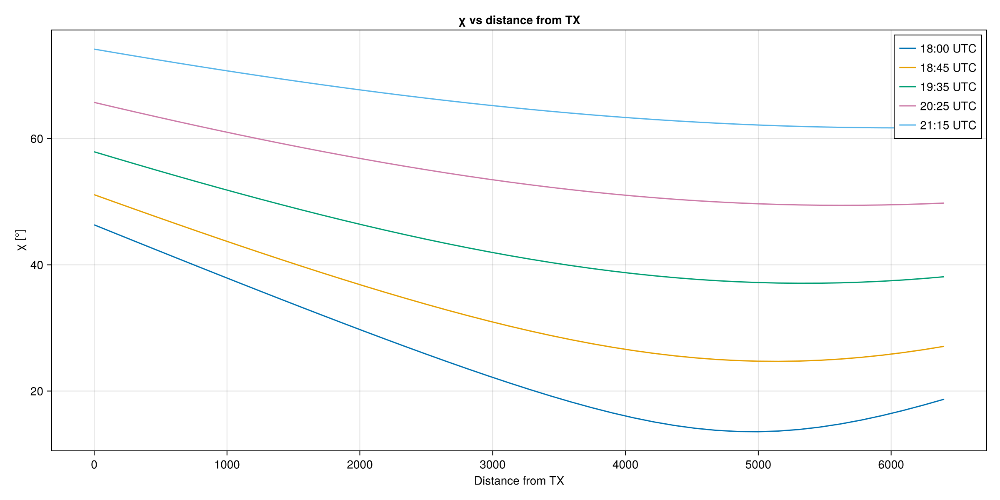

In [11]:
fig = Figure(size=(1200,600))
ax1 = Axis(fig[1, 1], xlabel="Distance from TX", ylabel= "χ [°]", title="χ vs distance from TX")
#CM.lines!(ax1, DateTime.(zdt_test1), sig2.(Δts,20.0), label="Unperturbed")
CM.lines!(ax1, dists./1e3, mat_sza_test1[1,:], label="$(Dates.format(zdt_test[1], "HH:MM Z"))")
CM.lines!(ax1, dists./1e3, mat_sza_test1[10,:], label="$(Dates.format(zdt_test[10], "HH:MM Z"))")
CM.lines!(ax1, dists./1e3, mat_sza_test1[20,:], label="$(Dates.format(zdt_test[20], "HH:MM Z"))")
CM.lines!(ax1, dists./1e3, mat_sza_test1[30,:], label="$(Dates.format(zdt_test[30], "HH:MM Z"))")
CM.lines!(ax1, dists./1e3, mat_sza_test1[40,:], label="$(Dates.format(zdt_test[40], "HH:MM Z"))")

CM.axislegend(ax1,fontsize=15,position=:rt)

fig

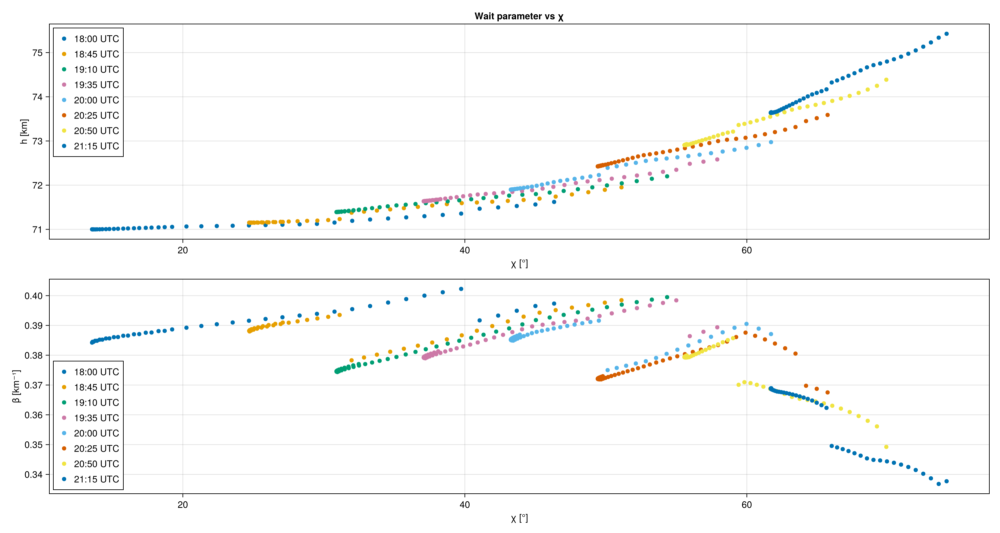

In [12]:
fig = Figure(size=(1500,800))
ax1 = Axis(fig[1, 1], xlabel="χ [°]", ylabel= "h [km]", title="Wait parameter vs χ")
#CM.lines!(ax1, DateTime.(zdt_test1), sig2.(Δts,20.0), label="Unperturbed")
CM.scatter!(ax1, mat_sza_test1[1,:], mat_hs[1,:],label="$(Dates.format(zdt_test[1], "HH:MM Z"))")
CM.scatter!(ax1, mat_sza_test1[10,:], mat_hs[10,:],label="$(Dates.format(zdt_test[10], "HH:MM Z"))")
CM.scatter!(ax1, mat_sza_test1[15,:], mat_hs[15,:],label="$(Dates.format(zdt_test[15], "HH:MM Z"))")
CM.scatter!(ax1, mat_sza_test1[20,:], mat_hs[20,:],label="$(Dates.format(zdt_test[20], "HH:MM Z"))")
CM.scatter!(ax1, mat_sza_test1[25,:], mat_hs[25,:],label="$(Dates.format(zdt_test[25], "HH:MM Z"))")
CM.scatter!(ax1, mat_sza_test1[30,:], mat_hs[30,:],label="$(Dates.format(zdt_test[30], "HH:MM Z"))")
CM.scatter!(ax1, mat_sza_test1[35,:], mat_hs[35,:],label="$(Dates.format(zdt_test[35], "HH:MM Z"))")
CM.scatter!(ax1, mat_sza_test1[40,:], mat_hs[40,:],label="$(Dates.format(zdt_test[40], "HH:MM Z"))")

CM.axislegend(ax1,fontsize=15,position=:lt)

ax2 = Axis(fig[2, 1], xlabel="χ [°]", ylabel= "β [km⁻¹]")#, title="χ vs distance from TX")

CM.scatter!(ax2, mat_sza_test1[1,:], mat_βs[1,:],label="$(Dates.format(zdt_test[1], "HH:MM Z"))")
CM.scatter!(ax2, mat_sza_test1[10,:], mat_βs[10,:],label="$(Dates.format(zdt_test[10], "HH:MM Z"))")
CM.scatter!(ax2, mat_sza_test1[15,:], mat_βs[15,:],label="$(Dates.format(zdt_test[15], "HH:MM Z"))")
CM.scatter!(ax2, mat_sza_test1[20,:], mat_βs[20,:],label="$(Dates.format(zdt_test[20], "HH:MM Z"))")
CM.scatter!(ax2, mat_sza_test1[25,:], mat_βs[25,:],label="$(Dates.format(zdt_test[25], "HH:MM Z"))")
CM.scatter!(ax2, mat_sza_test1[30,:], mat_βs[30,:],label="$(Dates.format(zdt_test[30], "HH:MM Z"))")
CM.scatter!(ax2, mat_sza_test1[35,:], mat_βs[35,:],label="$(Dates.format(zdt_test[35], "HH:MM Z"))")
CM.scatter!(ax2, mat_sza_test1[40,:], mat_βs[40,:],label="$(Dates.format(zdt_test[40], "HH:MM Z"))")

CM.axislegend(ax2,fontsize=15,position=:lb)


fig

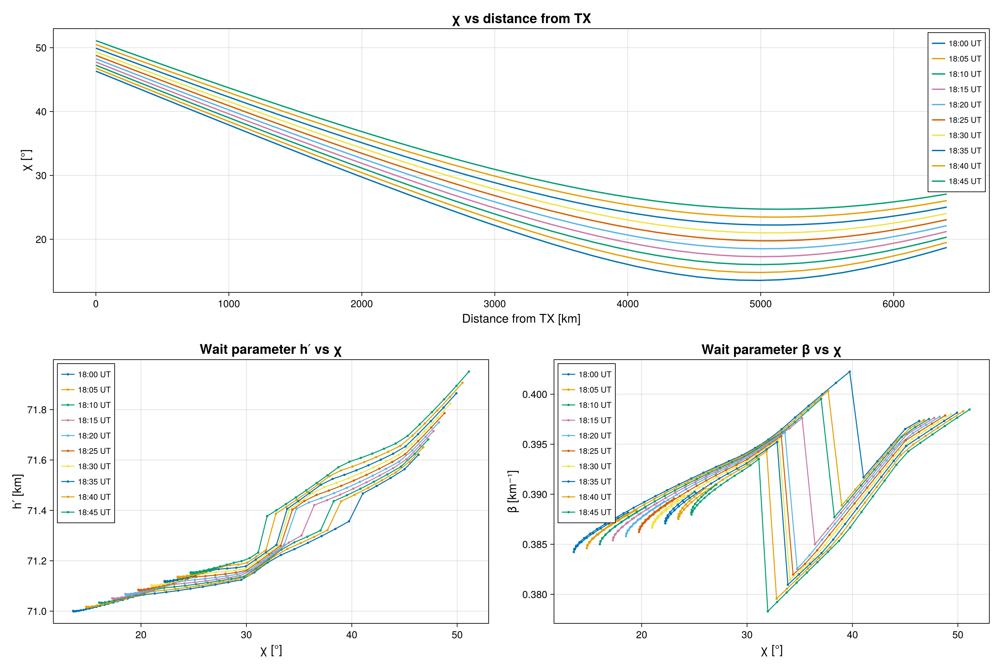

In [13]:
using CairoMakie
using Dates

fig = CairoMakie.Figure(size = (1500, 1000))

ax_chi_dist = CairoMakie.Axis(
    fig[1, 1:2],
    xlabel = "Distance from TX [km]",
    ylabel = "χ [°]",
    title = "χ vs distance from TX",
    xlabelsize = 18,
    ylabelsize = 18,
    titlesize = 20,
    xticklabelsize = 15,
    yticklabelsize = 15
)

ax_h_chi = CairoMakie.Axis(
    fig[2, 1],
    xlabel = "χ [°]",
    ylabel = "h′ [km]",
    title = "Wait parameter h′ vs χ",
    xlabelsize = 18,
    ylabelsize = 18,
    titlesize = 20,
    xticklabelsize = 15,
    yticklabelsize = 15
)

ax_beta_chi = CairoMakie.Axis(
    fig[2, 2],
    xlabel = "χ [°]",
    ylabel = "β [km⁻¹]",
    title = "Wait parameter β vs χ",
    xlabelsize = 18,
    ylabelsize = 18,
    titlesize = 20,
    xticklabelsize = 15,
    yticklabelsize = 15
)

dist_vec = dists[1:latstep:end]

for it in eachindex(zdt_test1[1:5:end])

    label_t = Dates.format(zdt_test1[it], "HH:MM") * " UT"

    CairoMakie.lines!(
        ax_chi_dist,
        dist_vec./1e3,
        mat_sza_test1[it, :],
        linewidth = 2,
        label = label_t
    )

    CairoMakie.scatterlines!(
        ax_h_chi,
        mat_sza_test1[it, :],
        mat_hs[it, :],
        markersize = 5,
        linewidth = 1.5,
        label = label_t
    )

    CairoMakie.scatterlines!(
        ax_beta_chi,
        mat_sza_test1[it, :],
        mat_βs[it, :],
        markersize = 5,
        linewidth = 1.5,
        label = label_t
    )
end

CairoMakie.axislegend(
    ax_chi_dist,
    position = :rt,
    labelsize = 12,
    framevisible = true
)

CairoMakie.axislegend(
    ax_h_chi,
    position = :lt,
    labelsize = 12,
    framevisible = true
)

CairoMakie.axislegend(
    ax_beta_chi,
    position = :lt,
    labelsize = 12,
    framevisible = true
)

CairoMakie.rowgap!(fig.layout, 25)
CairoMakie.colgap!(fig.layout, 25)
save("chi-h-beta-vs-ditance-and-time.pdf",fig)
fig

In [14]:
latstep

1

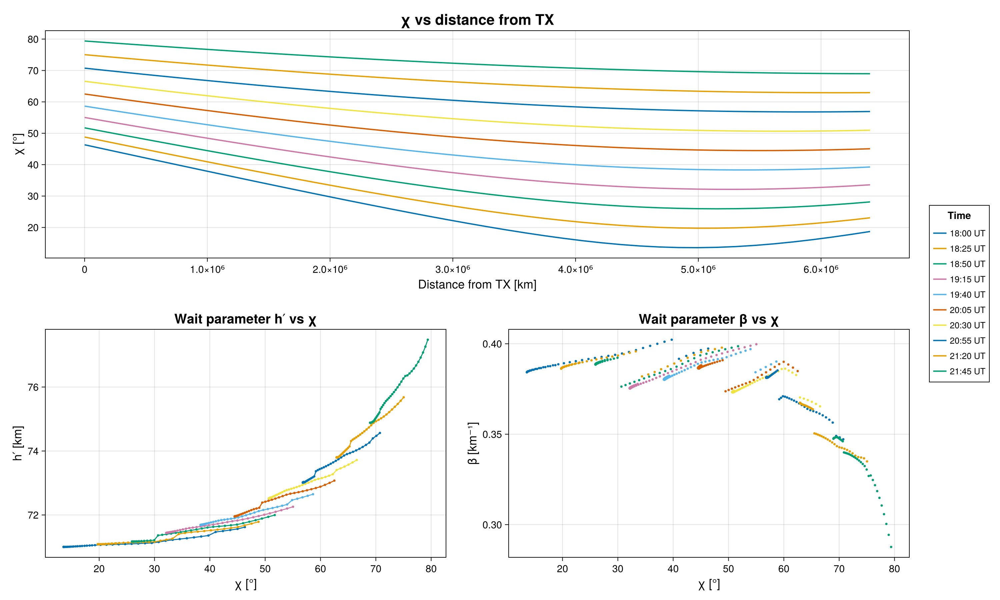

In [15]:
using CairoMakie
using Dates

fig = CairoMakie.Figure(size = (1500, 900))

ax_chi_dist = CairoMakie.Axis(
    fig[1, 1:2],
    xlabel = "Distance from TX [km]",
    ylabel = "χ [°]",
    title = "χ vs distance from TX",
    xlabelsize = 18,
    ylabelsize = 18,
    titlesize = 22,
    xticklabelsize = 15,
    yticklabelsize = 15
)

ax_h_chi = CairoMakie.Axis(
    fig[2, 1],
    xlabel = "χ [°]",
    ylabel = "h′ [km]",
    title = "Wait parameter h′ vs χ",
    xlabelsize = 18,
    ylabelsize = 18,
    titlesize = 20,
    xticklabelsize = 15,
    yticklabelsize = 15
)

ax_beta_chi = CairoMakie.Axis(
    fig[2, 2],
    xlabel = "χ [°]",
    ylabel = "β [km⁻¹]",
    title = "Wait parameter β vs χ",
    xlabelsize = 18,
    ylabelsize = 18,
    titlesize = 20,
    xticklabelsize = 15,
    yticklabelsize = 15
)

dist_vec = collect(dists[1:latstep:end])

nt = length(zdt_test1)
nx = size(mat_sza_test1, 2)

@assert length(dist_vec) == nx "dist_vec y las matrices no tienen el mismo número de puntos espaciales."

legend_plots = []
legend_labels = String[]

for it in 1:5:nt

    label_t = Dates.format(zdt_test1[it], "HH:MM") * " UT"

    χvals = Float64.(vec(mat_sza_test1[it, :]))
    hvals = Float64.(vec(mat_hs[it, :]))
    βvals = Float64.(vec(mat_βs[it, :]))

    plt = CairoMakie.lines!(
        ax_chi_dist,
        dist_vec,
        χvals,
        linewidth = 2,
        label = label_t
    )

    push!(legend_plots, plt)
    push!(legend_labels, label_t)

    imin = argmin(χvals)

    idx1 = collect(1:imin)
    idx2 = collect(imin:nx)

    idx1 = idx1[sortperm(χvals[idx1])]
    idx2 = idx2[sortperm(χvals[idx2])]

    χ_plot = vcat(χvals[idx1], NaN, χvals[idx2])
    h_plot = vcat(hvals[idx1], NaN, hvals[idx2])
    β_plot = vcat(βvals[idx1], NaN, βvals[idx2])

    CairoMakie.scatterlines!(
        ax_h_chi,
        χ_plot,
        h_plot,
        markersize = 5,
        linewidth = 1.5
    )

    CairoMakie.scatter!(
        ax_beta_chi,
        χ_plot,
        β_plot,
        markersize = 5,
        #linewidth = 1.5
    )
end

CairoMakie.Legend(
    fig[1:2, 3],
    legend_plots,
    legend_labels,
    "Time",
    labelsize = 13,
    titlesize = 15,
    framevisible = true
)

CairoMakie.rowgap!(fig.layout, 30)
CairoMakie.colgap!(fig.layout, 30)
save("chi-h-beta-vs-ditance-and-time.pdf",fig)

fig

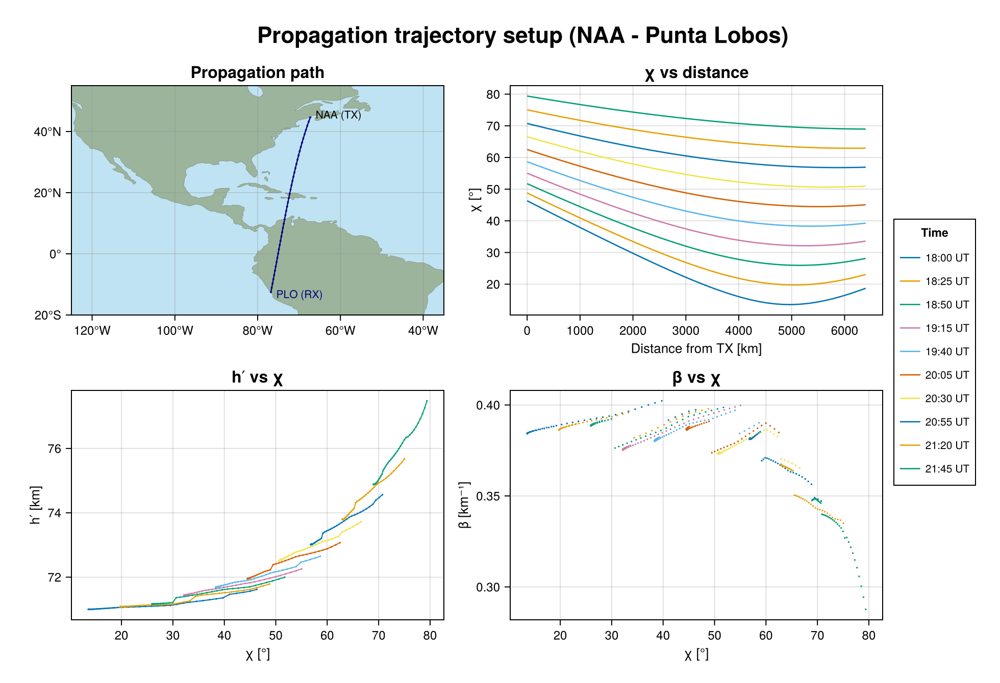

In [73]:
using CairoMakie
using GeoMakie
using Dates

# ============================================================
# Helpers para ticks geográficos
# ============================================================

fmt_lon(x) = x < 0 ? "$(abs(round(Int, x)))°W" :
             x > 0 ? "$(round(Int, x))°E" :
             "0°"

fmt_lat(y) = y < 0 ? "$(abs(round(Int, y)))°S" :
             y > 0 ? "$(round(Int, y))°N" :
             "0°"

# ============================================================
# Figura compacta, con fonts grandes
# ============================================================

fig = CairoMakie.Figure(
    size = (980, 670),
    fontsize = 13,
    figure_padding = (14, 12, 12, 8)   # left, right, bottom, top
)

# Título general
CairoMakie.Label(
    fig[0, 1:3],
    "Propagation trajectory setup (NAA - Punta Lobos)",
    fontsize = 22,
    font = :bold,
    padding = (0, 0, 2, 2)
)

region_paper = (-125.0, -35.0, -20.0, 55.0)
lon_min, lon_max, lat_min, lat_max = region_paper

landcol  = "#9BB49B"
watercol = "#BFE3F2"

# ============================================================
# Panel [1,1] -> mapa
# ============================================================

ax_map = CairoMakie.Axis(
    fig[1, 1],
    title = "Propagation path",
    titlesize = 16,
    xlabel = "",
    ylabel = "",
    xticks = -120:20:-40,
    yticks = -20:20:40,
    xtickformat = xs -> [fmt_lon(x) for x in xs],
    ytickformat = ys -> [fmt_lat(y) for y in ys],
    xticklabelsize = 12,
    yticklabelsize = 12,
    xticksize = 5,
    yticksize = 5,
    xgridvisible = false,   # el grid del mapa lo dibujamos manualmente
    ygridvisible = false,
    limits = ((lon_min, lon_max), (lat_min, lat_max))
)

# Fondo del mar
CairoMakie.poly!(
    ax_map,
    Point2f[
        (lon_min, lat_min),
        (lon_max, lat_min),
        (lon_max, lat_max),
        (lon_min, lat_max)
    ],
    color = watercol,
    strokewidth = 0
)

# Continentes
CairoMakie.poly!(
    ax_map,
    GeoMakie.land(),
    color = landcol,
    strokecolor = :gray45,
    strokewidth = 0.25
)

# ------------------------------------------------------------
# Grid manual del mapa (recto y visible)
# ------------------------------------------------------------

grid_lons = -120:20:-40
grid_lats = -20:20:40

for x in grid_lons
    CairoMakie.lines!(
        ax_map,
        [x, x],
        [lat_min, lat_max],
        color = (:gray55, 0.45),
        linewidth = 0.65
    )
end

for y in grid_lats
    CairoMakie.lines!(
        ax_map,
        [lon_min, lon_max],
        [y, y],
        color = (:gray55, 0.45),
        linewidth = 0.65
    )
end

# Trayectoria
CairoMakie.scatterlines!(
    ax_map,
    lons,
    lats,
    color = :navy,
    linewidth = 1.2,
    markersize = 2.8
)

# Etiquetas TX/RX
CairoMakie.text!(
    ax_map,
    lons[1] + 1.3,
    lats[1] + 0.9,
    text = "$(tx_station2) (TX)",
    color = :black,
    fontsize = 10.5,
    align = (:left, :center)
)

CairoMakie.text!(
    ax_map,
    lons[end] + 1.3,
    lats[end] - 0.7,
    text = "$(rx_station) (RX)",
    color = :navy,
    fontsize = 10.5,
    align = (:left, :center)
)

# ============================================================
# Panel [1,2] -> χ vs distancia
# ============================================================

ax_chi_dist = CairoMakie.Axis(
    fig[1, 2],
    xlabel = "Distance from TX [km]",
    ylabel = "χ [°]",
    title = "χ vs distance",
    xlabelsize = 13,
    ylabelsize = 13,
    titlesize = 16,
    xticklabelsize = 12,
    yticklabelsize = 12,
    xticksize = 5,
    yticksize = 5,
    xgridvisible = true,
    ygridvisible = true
)

# ============================================================
# Panel [2,1] -> h′ vs χ
# ============================================================

ax_h_chi = CairoMakie.Axis(
    fig[2, 1],
    xlabel = "χ [°]",
    ylabel = "h′ [km]",
    title = "h′ vs χ",
    xlabelsize = 13,
    ylabelsize = 13,
    titlesize = 16,
    xticklabelsize = 12,
    yticklabelsize = 12,
    xticksize = 5,
    yticksize = 5,
    xgridvisible = true,
    ygridvisible = true
)

# ============================================================
# Panel [2,2] -> β vs χ
# ============================================================

ax_beta_chi = CairoMakie.Axis(
    fig[2, 2],
    xlabel = "χ [°]",
    ylabel = "β [km⁻¹]",
    title = "β vs χ",
    xlabelsize = 13,
    ylabelsize = 13,
    titlesize = 16,
    xticklabelsize = 12,
    yticklabelsize = 12,
    xticksize = 5,
    yticksize = 5,
    xgridvisible = true,
    ygridvisible = true
)

# ============================================================
# Datos
# ============================================================

dist_vec = collect(dists[1:latstep:end])

nt = length(zdt_test1)
nx = size(mat_sza_test1, 2)

@assert length(dist_vec) == nx "dist_vec y las matrices no tienen el mismo número de puntos espaciales."

legend_plots = Any[]
legend_labels = String[]

for it in 1:5:nt
    label_t = Dates.format(zdt_test1[it], "HH:MM") * " UT"

    χvals = Float64.(vec(mat_sza_test1[it, :]))
    hvals = Float64.(vec(mat_hs[it, :]))
    βvals = Float64.(vec(mat_βs[it, :]))

    plt = CairoMakie.lines!(
        ax_chi_dist,
        dist_vec./1e3,
        χvals,
        linewidth = 1.3,
        label = label_t
    )

    push!(legend_plots, plt)
    push!(legend_labels, label_t)

    imin = argmin(χvals)

    idx1 = collect(1:imin)
    idx2 = collect(imin:nx)

    idx1 = idx1[sortperm(χvals[idx1])]
    idx2 = idx2[sortperm(χvals[idx2])]

    χ_plot = vcat(χvals[idx1], NaN, χvals[idx2])
    h_plot = vcat(hvals[idx1], NaN, hvals[idx2])
    β_plot = vcat(βvals[idx1], NaN, βvals[idx2])

    CairoMakie.scatterlines!(
        ax_h_chi,
        χ_plot,
        h_plot,
        markersize = 2.4,
        linewidth = 1.05
    )

    CairoMakie.scatter!(
        ax_beta_chi,
        χ_plot,
        β_plot,
        markersize = 2.4
    )
end

# ============================================================
# Leyenda externa
# ============================================================

CairoMakie.Legend(
    fig[1:2, 3],
    legend_plots,
    legend_labels,
    "Time",
    labelsize = 10.5,
    titlesize = 11.5,
    framevisible = true,
    halign = :center,
    valign = :center
)

# ============================================================
# Ajuste del layout
# ============================================================

CairoMakie.colsize!(fig.layout, 1, CairoMakie.Fixed(365))
CairoMakie.colsize!(fig.layout, 2, CairoMakie.Fixed(365))
CairoMakie.colsize!(fig.layout, 3, CairoMakie.Fixed(78))

CairoMakie.rowsize!(fig.layout, 1, CairoMakie.Fixed(225))
CairoMakie.rowsize!(fig.layout, 2, CairoMakie.Fixed(225))

CairoMakie.rowgap!(fig.layout, 12)
CairoMakie.colgap!(fig.layout, 12)

trim!(fig.layout)

# ============================================================
# Guardar
# ============================================================

CairoMakie.save(
    "/home/jp/basefolder_JP/vlf_2x2_panel_compact_bigfonts_withgri.pdf",
    fig
)

CairoMakie.save(
    "/home/jp/basefolder_JP/vlf_2x2_panel_compact_bigfonts_withgrid.png",
    fig;
    px_per_unit = 1
)

fig

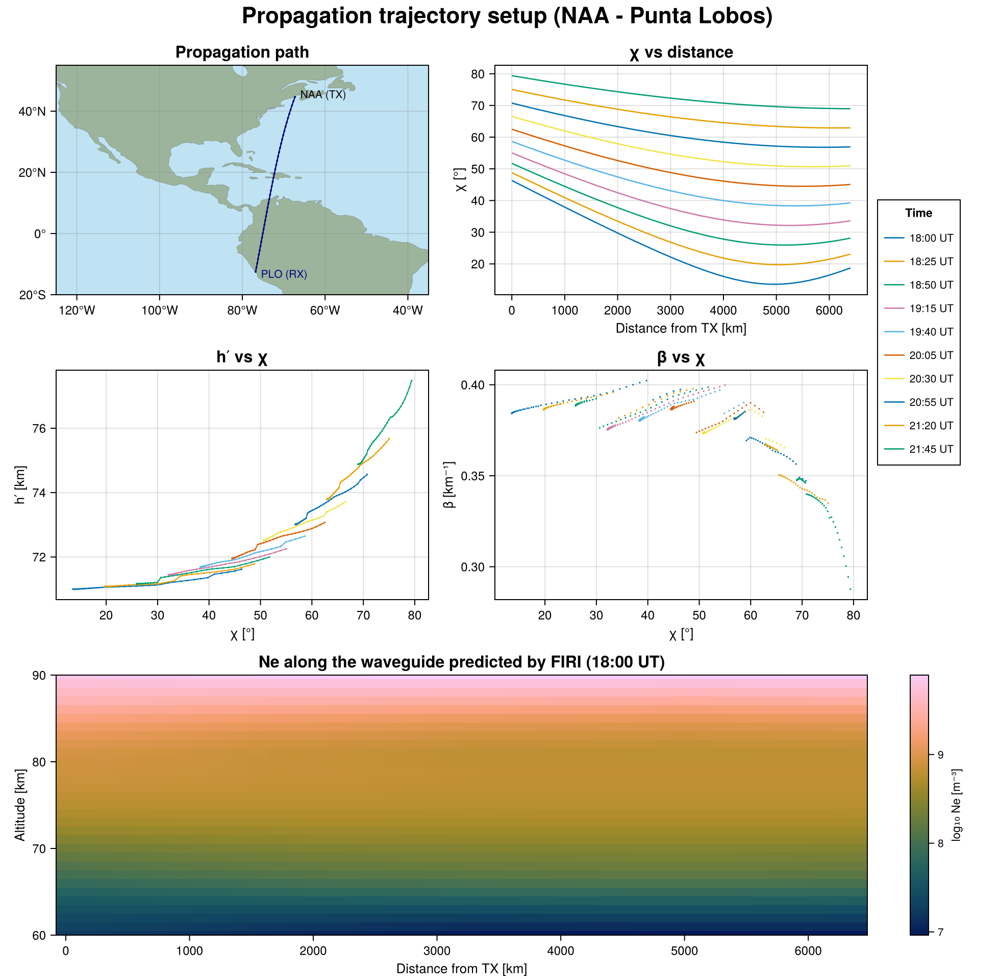

In [31]:
using CairoMakie
using GeoMakie
using Dates

# ============================================================
# Helpers para ticks geográficos
# ============================================================

fmt_lon(x) = x < 0 ? "$(abs(round(Int, x)))°W" :
             x > 0 ? "$(round(Int, x))°E" :
             "0°"

fmt_lat(y) = y < 0 ? "$(abs(round(Int, y)))°S" :
             y > 0 ? "$(round(Int, y))°N" :
             "0°"

# ============================================================
# Verificaciones mínimas
# ============================================================

dist_vec = collect(dists[1:latstep:end])

nt = length(zdt_test1)
nx = size(mat_sza_test1, 2)

@assert length(dist_vec) == nx "dist_vec y las matrices no tienen el mismo número de puntos espaciales."
@assert size(nefiri_mat_test1, 2) == nx "nefiri_mat_test1 no coincide con el eje espacial usado en los otros paneles."
@assert size(nefiri_mat_test1, 3) >= 1 "nefiri_mat_test1 no tiene dimensión temporal válida."

dist_km = dist_vec ./ 1e3
alt_km  = alt ./ 1e3

# ============================================================
# Primer instante FIRI, restringido a 60–90 km
# ============================================================

alt_mask = (alt_km .>= 60.0) .& (alt_km .<= 90.0)
@assert any(alt_mask) "No hay alturas dentro del rango 60–90 km."

alt_km_plot = alt_km[alt_mask]

@views ne_firi_0 = Float64.(nefiri_mat_test1[alt_mask, :, 1])   # altitud × distancia
log10_ne_firi_0 = log10.(max.(ne_firi_0, eps(Float64)))
log10_ne_firi_0_plot = permutedims(log10_ne_firi_0)             # distancia × altitud

tlabel0 = Dates.format(zdt_test1[1], "HH:MM") * " UT"

# ============================================================
# Figura compacta, ahora con 3 filas
# ============================================================

fig = CairoMakie.Figure(
    size = (980, 960),
    fontsize = 13,
    figure_padding = (14, 10, 12, 8)
)

CairoMakie.Label(
    fig[0, 1:3],
    "Propagation trajectory setup (NAA - Punta Lobos)",
    fontsize = 22,
    font = :bold,
    padding = (0, 0, 2, 2)
)

region_paper = (-125.0, -35.0, -20.0, 55.0)
lon_min, lon_max, lat_min, lat_max = region_paper

landcol  = "#9BB49B"
watercol = "#BFE3F2"

# ============================================================
# Panel [1,1] -> mapa
# ============================================================

ax_map = CairoMakie.Axis(
    fig[1, 1],
    title = "Propagation path",
    titlesize = 16,
    xlabel = "",
    ylabel = "",
    xticks = -120:20:-40,
    yticks = -20:20:40,
    xtickformat = xs -> [fmt_lon(x) for x in xs],
    ytickformat = ys -> [fmt_lat(y) for y in ys],
    xticklabelsize = 12,
    yticklabelsize = 12,
    xticksize = 5,
    yticksize = 5,
    xgridvisible = false,
    ygridvisible = false,
    limits = ((lon_min, lon_max), (lat_min, lat_max))
)

CairoMakie.poly!(
    ax_map,
    Point2f[
        (lon_min, lat_min),
        (lon_max, lat_min),
        (lon_max, lat_max),
        (lon_min, lat_max)
    ],
    color = watercol,
    strokewidth = 0
)

CairoMakie.poly!(
    ax_map,
    GeoMakie.land(),
    color = landcol,
    strokecolor = :gray45,
    strokewidth = 0.25
)

grid_lons = -120:20:-40
grid_lats = -20:20:40

for x in grid_lons
    CairoMakie.lines!(
        ax_map,
        [x, x],
        [lat_min, lat_max],
        color = (:gray55, 0.45),
        linewidth = 0.65
    )
end

for y in grid_lats
    CairoMakie.lines!(
        ax_map,
        [lon_min, lon_max],
        [y, y],
        color = (:gray55, 0.45),
        linewidth = 0.65
    )
end

CairoMakie.scatterlines!(
    ax_map,
    lons,
    lats,
    color = :navy,
    linewidth = 1.2,
    markersize = 2.8
)

CairoMakie.text!(
    ax_map,
    lons[1] + 1.3,
    lats[1] + 0.9,
    text = "$(tx_station2) (TX)",
    color = :black,
    fontsize = 10.5,
    align = (:left, :center)
)

CairoMakie.text!(
    ax_map,
    lons[end] + 1.3,
    lats[end] - 0.7,
    text = "$(rx_station) (RX)",
    color = :navy,
    fontsize = 10.5,
    align = (:left, :center)
)

# ============================================================
# Panel [1,2] -> χ vs distancia
# ============================================================

ax_chi_dist = CairoMakie.Axis(
    fig[1, 2],
    xlabel = "Distance from TX [km]",
    ylabel = "χ [°]",
    title = "χ vs distance",
    xlabelsize = 13,
    ylabelsize = 13,
    titlesize = 16,
    xticklabelsize = 12,
    yticklabelsize = 12,
    xticksize = 5,
    yticksize = 5,
    xgridvisible = true,
    ygridvisible = true
)

# ============================================================
# Panel [2,1] -> h′ vs χ
# ============================================================

ax_h_chi = CairoMakie.Axis(
    fig[2, 1],
    xlabel = "χ [°]",
    ylabel = "h′ [km]",
    title = "h′ vs χ",
    xlabelsize = 13,
    ylabelsize = 13,
    titlesize = 16,
    xticklabelsize = 12,
    yticklabelsize = 12,
    xticksize = 5,
    yticksize = 5,
    xgridvisible = true,
    ygridvisible = true
)

# ============================================================
# Panel [2,2] -> β vs χ
# ============================================================

ax_beta_chi = CairoMakie.Axis(
    fig[2, 2],
    xlabel = "χ [°]",
    ylabel = "β [km⁻¹]",
    title = "β vs χ",
    xlabelsize = 13,
    ylabelsize = 13,
    titlesize = 16,
    xticklabelsize = 12,
    yticklabelsize = 12,
    xticksize = 5,
    yticksize = 5,
    xgridvisible = true,
    ygridvisible = true
)

# ============================================================
# Panel [3,1:2] -> FIRI Ne vs distancia y altura (primer instante)
# ============================================================

ax_ne = CairoMakie.Axis(
    fig[3, 1:2],
    xlabel = "Distance from TX [km]",
    ylabel = "Altitude [km]",
    title = "Ne along the waveguide predicted by FIRI ($tlabel0)",
    xlabelsize = 13,
    ylabelsize = 13,
    titlesize = 16,
    xticklabelsize = 12,
    yticklabelsize = 12,
    xticksize = 5,
    yticksize = 5,
    xgridvisible = true,
    ygridvisible = true,
    limits = (nothing, (60.0, 90.0))
)

hm = CairoMakie.heatmap!(
    ax_ne,
    dist_km,
    alt_km_plot,
    log10_ne_firi_0_plot;
    colormap = :batlow
)

# ============================================================
# Curvas temporales de las dos primeras filas
# ============================================================

legend_plots = Any[]
legend_labels = String[]

for it in 1:5:nt
    label_t = Dates.format(zdt_test1[it], "HH:MM") * " UT"

    χvals = Float64.(vec(mat_sza_test1[it, :]))
    hvals = Float64.(vec(mat_hs[it, :]))
    βvals = Float64.(vec(mat_βs[it, :]))

    plt = CairoMakie.lines!(
        ax_chi_dist,
        dist_km,
        χvals,
        linewidth = 1.3,
        label = label_t
    )

    push!(legend_plots, plt)
    push!(legend_labels, label_t)

    imin = argmin(χvals)

    idx1 = collect(1:imin)
    idx2 = collect(imin:nx)

    idx1 = idx1[sortperm(χvals[idx1])]
    idx2 = idx2[sortperm(χvals[idx2])]

    χ_plot = vcat(χvals[idx1], NaN, χvals[idx2])
    h_plot = vcat(hvals[idx1], NaN, hvals[idx2])
    β_plot = vcat(βvals[idx1], NaN, βvals[idx2])

    CairoMakie.scatterlines!(
        ax_h_chi,
        χ_plot,
        h_plot,
        markersize = 2.4,
        linewidth = 1.05
    )

    CairoMakie.scatter!(
        ax_beta_chi,
        χ_plot,
        β_plot,
        markersize = 2.4
    )
end

# ============================================================
# Leyenda externa y colorbar
# ============================================================

CairoMakie.Legend(
    fig[1:2, 3],
    legend_plots,
    legend_labels,
    "Time",
    labelsize = 10.5,
    titlesize = 11.5,
    framevisible = true,
    halign = :center,
    valign = :center
)

CairoMakie.Colorbar(
    fig[3, 3],
    hm,
    label = "log₁₀ Ne [m⁻³]",
    labelsize = 11.5,
    ticklabelsize = 10.5,
    width = 18
)

# ============================================================
# Ajuste del layout
# ============================================================

CairoMakie.colsize!(fig.layout, 1, CairoMakie.Fixed(365))
CairoMakie.colsize!(fig.layout, 2, CairoMakie.Fixed(365))
CairoMakie.colsize!(fig.layout, 3, CairoMakie.Fixed(78))

CairoMakie.rowsize!(fig.layout, 1, CairoMakie.Fixed(225))
CairoMakie.rowsize!(fig.layout, 2, CairoMakie.Fixed(225))
CairoMakie.rowsize!(fig.layout, 3, CairoMakie.Fixed(255))

CairoMakie.rowgap!(fig.layout, 12)
CairoMakie.colgap!(fig.layout, 12)

trim!(fig.layout)

CairoMakie.save(
    "/home/jp/basefolder_JP/vlf_3row_panel_compact_bigfonts_with_FIRIheatmap_60_90km_batlow.pdf",
    fig
)

CairoMakie.save(
    "/home/jp/basefolder_JP/vlf_3row_panel_compact_bigfonts_with_FIRIheatmap_60_90km_batlow.png",
    fig;
    px_per_unit = 1
)

fig

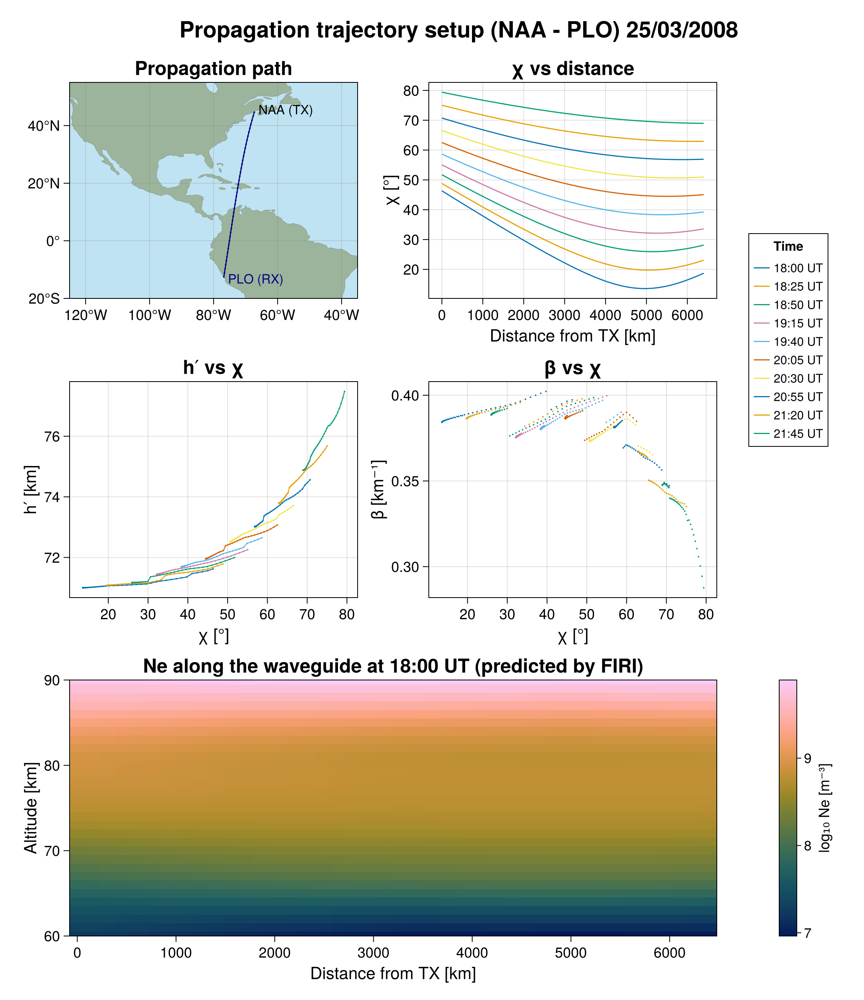

In [37]:
using CairoMakie
using GeoMakie
using Dates

# ============================================================
# Helpers para ticks geográficos
# ============================================================

fmt_lon(x) = x < 0 ? "$(abs(round(Int, x)))°W" :
             x > 0 ? "$(round(Int, x))°E" :
             "0°"

fmt_lat(y) = y < 0 ? "$(abs(round(Int, y)))°S" :
             y > 0 ? "$(round(Int, y))°N" :
             "0°"

# ============================================================
# Tamaños de fuente
# ============================================================

FS_FIG      = 18
FS_SUPTITLE = 28
FS_TITLE    = 24
FS_LABEL    = 21
FS_TICK     = 18
FS_TEXT     = 16
FS_LEGEND   = 15
FS_CBAR     = 18

# ============================================================
# Verificaciones mínimas
# ============================================================

dist_vec = collect(dists[1:latstep:end])

nt = length(zdt_test1)
nx = size(mat_sza_test1, 2)

@assert length(dist_vec) == nx "dist_vec y las matrices no tienen el mismo número de puntos espaciales."
@assert size(nefiri_mat_test1, 2) == nx "nefiri_mat_test1 no coincide con el eje espacial usado en los otros paneles."
@assert size(nefiri_mat_test1, 3) >= 1 "nefiri_mat_test1 no tiene dimensión temporal válida."

dist_km = dist_vec ./ 1e3
alt_km  = alt ./ 1e3

# ============================================================
# Primer instante FIRI, restringido a 60–90 km
# ============================================================

alt_mask = (alt_km .>= 60.0) .& (alt_km .<= 90.0)
@assert any(alt_mask) "No hay alturas dentro del rango 60–90 km."

alt_km_plot = alt_km[alt_mask]

@views ne_firi_0 = Float64.(nefiri_mat_test1[alt_mask, :, 1])   # altitud × distancia
log10_ne_firi_0 = log10.(max.(ne_firi_0, eps(Float64)))
log10_ne_firi_0_plot = permutedims(log10_ne_firi_0)             # distancia × altitud

tlabel0 = Dates.format(zdt_test1[1], "HH:MM") * " UT"

# ============================================================
# Figura
# ============================================================

fig = CairoMakie.Figure(
    size = (1080, 1250),
    fontsize = FS_FIG,
    figure_padding = (70, 20, 18, 12)   # left, right, bottom, top
)

CairoMakie.Label(
    fig[0, 1:3],
    "Propagation trajectory setup (NAA - PLO) 25/03/2008",
    fontsize = FS_SUPTITLE,
    font = :bold,
    padding = (0, 0, 4, 4)
)

region_paper = (-125.0, -35.0, -20.0, 55.0)
lon_min, lon_max, lat_min, lat_max = region_paper

landcol  = "#9BB49B"
watercol = "#BFE3F2"

# ============================================================
# Panel [1,1] -> mapa
# ============================================================

ax_map = CairoMakie.Axis(
    fig[1, 1],
    title = "Propagation path",
    titlesize = FS_TITLE,
    xlabel = "",
    ylabel = "",
    xticks = -120:20:-40,
    yticks = -20:20:40,
    xtickformat = xs -> [fmt_lon(x) for x in xs],
    ytickformat = ys -> [fmt_lat(y) for y in ys],
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
    xticksize = 7,
    yticksize = 7,
    xgridvisible = false,
    ygridvisible = false,
    limits = ((lon_min, lon_max), (lat_min, lat_max))
)

CairoMakie.poly!(
    ax_map,
    Point2f[
        (lon_min, lat_min),
        (lon_max, lat_min),
        (lon_max, lat_max),
        (lon_min, lat_max)
    ],
    color = watercol,
    strokewidth = 0
)

CairoMakie.poly!(
    ax_map,
    GeoMakie.land(),
    color = landcol,
    strokecolor = :gray45,
    strokewidth = 0.25
)

grid_lons = -120:20:-40
grid_lats = -20:20:40

for x in grid_lons
    CairoMakie.lines!(
        ax_map,
        [x, x],
        [lat_min, lat_max],
        color = (:gray55, 0.45),
        linewidth = 0.65
    )
end

for y in grid_lats
    CairoMakie.lines!(
        ax_map,
        [lon_min, lon_max],
        [y, y],
        color = (:gray55, 0.45),
        linewidth = 0.65
    )
end

CairoMakie.scatterlines!(
    ax_map,
    lons,
    lats,
    color = :navy,
    linewidth = 1.4,
    markersize = 3.0
)

CairoMakie.text!(
    ax_map,
    lons[1] + 1.3,
    lats[1] + 0.9,
    text = "$(tx_station2) (TX)",
    color = :black,
    fontsize = FS_TEXT,
    align = (:left, :center)
)

CairoMakie.text!(
    ax_map,
    lons[end] + 1.3,
    lats[end] - 0.7,
    text = "$(rx_station) (RX)",
    color = :navy,
    fontsize = FS_TEXT,
    align = (:left, :center)
)

# ============================================================
# Panel [1,2] -> χ vs distancia
# ============================================================

ax_chi_dist = CairoMakie.Axis(
    fig[1, 2],
    xlabel = "Distance from TX [km]",
    ylabel = "χ [°]",
    title = "χ vs distance",
    xlabelsize = FS_LABEL,
    ylabelsize = FS_LABEL,
    titlesize = FS_TITLE,
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
    xticksize = 7,
    yticksize = 7,
    xgridvisible = true,
    ygridvisible = true
)

# ============================================================
# Panel [2,1] -> h′ vs χ
# ============================================================

ax_h_chi = CairoMakie.Axis(
    fig[2, 1],
    xlabel = "χ [°]",
    ylabel = "h′ [km]",
    title = "h′ vs χ",
    xlabelsize = FS_LABEL,
    ylabelsize = FS_LABEL,
    titlesize = FS_TITLE,
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
    xticksize = 7,
    yticksize = 7,
    xgridvisible = true,
    ygridvisible = true
)

# ============================================================
# Panel [2,2] -> β vs χ
# ============================================================

ax_beta_chi = CairoMakie.Axis(
    fig[2, 2],
    xlabel = "χ [°]",
    ylabel = "β [km⁻¹]",
    title = "β vs χ",
    xlabelsize = FS_LABEL,
    ylabelsize = FS_LABEL,
    titlesize = FS_TITLE,
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
    xticksize = 7,
    yticksize = 7,
    xgridvisible = true,
    ygridvisible = true
)

# ============================================================
# Panel [3,1:2] -> FIRI Ne vs distancia y altura (primer instante)
# ============================================================

ax_ne = CairoMakie.Axis(
    fig[3, 1:2],
    xlabel = "Distance from TX [km]",
    ylabel = "Altitude [km]",
    title = "Ne along the waveguide at $tlabel0 (predicted by FIRI)",
    xlabelsize = FS_LABEL,
    ylabelsize = FS_LABEL,
    titlesize = FS_TITLE,
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
    xticksize = 7,
    yticksize = 7,
    xgridvisible = true,
    ygridvisible = true,
    limits = (nothing, (60.0, 90.0))
)

hm = CairoMakie.heatmap!(
    ax_ne,
    dist_km,
    alt_km_plot,
    log10_ne_firi_0_plot;
    colormap = :batlow
)

# ============================================================
# Curvas temporales de las dos primeras filas
# ============================================================

legend_plots = Any[]
legend_labels = String[]

for it in 1:5:nt
    label_t = Dates.format(zdt_test1[it], "HH:MM") * " UT"

    χvals = Float64.(vec(mat_sza_test1[it, :]))
    hvals = Float64.(vec(mat_hs[it, :]))
    βvals = Float64.(vec(mat_βs[it, :]))

    plt = CairoMakie.lines!(
        ax_chi_dist,
        dist_km,
        χvals,
        linewidth = 1.4,
        label = label_t
    )

    push!(legend_plots, plt)
    push!(legend_labels, label_t)

    imin = argmin(χvals)

    idx1 = collect(1:imin)
    idx2 = collect(imin:nx)

    idx1 = idx1[sortperm(χvals[idx1])]
    idx2 = idx2[sortperm(χvals[idx2])]

    χ_plot = vcat(χvals[idx1], NaN, χvals[idx2])
    h_plot = vcat(hvals[idx1], NaN, hvals[idx2])
    β_plot = vcat(βvals[idx1], NaN, βvals[idx2])

    CairoMakie.scatterlines!(
        ax_h_chi,
        χ_plot,
        h_plot,
        markersize = 2.8,
        linewidth = 1.15
    )

    CairoMakie.scatter!(
        ax_beta_chi,
        χ_plot,
        β_plot,
        markersize = 2.8
    )
end

# ============================================================
# Leyenda externa y colorbar
# ============================================================

CairoMakie.Legend(
    fig[1:2, 3],
    legend_plots,
    legend_labels,
    "Time",
    labelsize = FS_LEGEND,
    titlesize = FS_LEGEND + 1,
    framevisible = true,
    halign = :center,
    valign = :center
)

CairoMakie.Colorbar(
    fig[3, 3],
    hm,
    label = "log₁₀ Ne [m⁻³]",
    labelsize = FS_CBAR,
    ticklabelsize = FS_CBAR - 1,
    width = 22
)

# ============================================================
# Ajuste del layout
# ============================================================

CairoMakie.colsize!(fig.layout, 1, CairoMakie.Fixed(360))
CairoMakie.colsize!(fig.layout, 2, CairoMakie.Fixed(360))
CairoMakie.colsize!(fig.layout, 3, CairoMakie.Fixed(150))

CairoMakie.rowsize!(fig.layout, 1, CairoMakie.Fixed(270))
CairoMakie.rowsize!(fig.layout, 2, CairoMakie.Fixed(270))
CairoMakie.rowsize!(fig.layout, 3, CairoMakie.Fixed(320))

CairoMakie.rowgap!(fig.layout, 14)
CairoMakie.colgap!(fig.layout, 14)

trim!(fig.layout)

CairoMakie.save(
    "/home/jp/basefolder_JP/propagation-setup-3-rows.pdf",
    fig
)

CairoMakie.save(
    "/home/jp/basefolder_JP/propagation-setup-3-rows.png",
    fig;
    px_per_unit = 1
)

fig

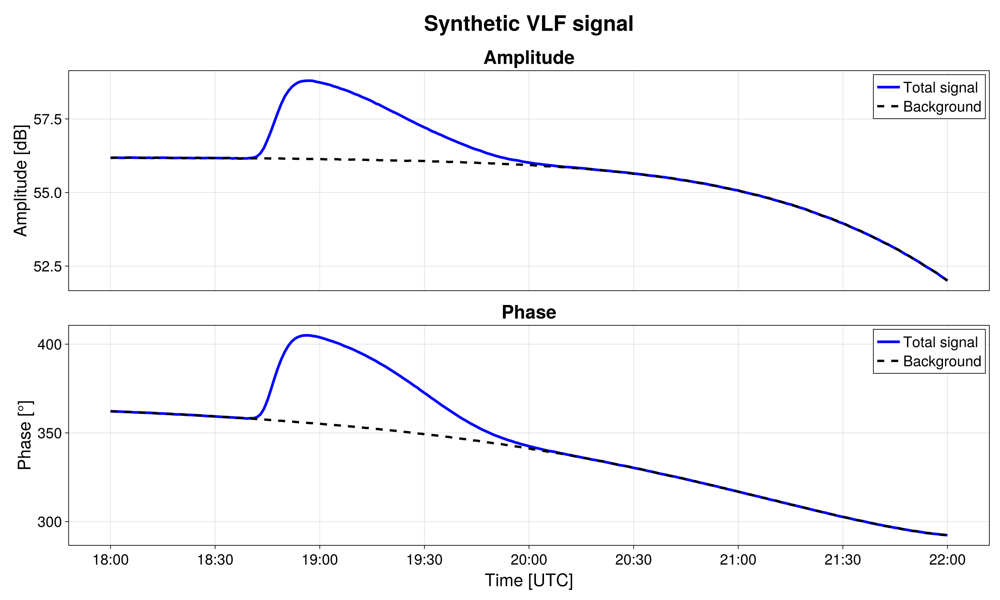

In [111]:
# ============================================================
# Figura 2x1 "paper-like":
#   Arriba: amplitud total vs background
#   Abajo:  fase total vs background
#
# Señal total  : azul sólido
# Background   : negro dashed
# ============================================================

using HDF5
using Dates
using CairoMakie

# -----------------------------
# 1) Cargar archivo .h5 sintético
# -----------------------------
PROJECT_ROOT_LOCAL = isdefined(Main, :PROJECT_ROOT) ? PROJECT_ROOT : pwd()

h5_candidates = [
    "synthetic_F3_nexp_seed_fine2.h5",
    joinpath(PROJECT_ROOT_LOCAL, "synthetic_F3_nexp_seed_fine2.h5")
]

existing_h5 = filter(isfile, h5_candidates)
@assert !isempty(existing_h5) "No encontré synthetic_F3_nexp_seed_fine2.h5 en pwd() ni en PROJECT_ROOT."

filename_syn = existing_h5[1]

timestamps = Float64.(h5read(filename_syn, "timestamps"))
A_bg       = Float64.(h5read(filename_syn, "A_bg"))
phi_bg     = Float64.(h5read(filename_syn, "phi_bg"))
A_syn      = Float64.(h5read(filename_syn, "A_syn"))
phi_syn    = Float64.(h5read(filename_syn, "phi_syn"))

# -----------------------------
# 2) Eje temporal
# -----------------------------
time_dt = Dates.unix2datetime.(timestamps)
time_hours = (timestamps .- first(timestamps)) ./ 3600.0

tini = ceil(first(time_dt), Minute(30))
tfin = floor(last(time_dt), Minute(30))
xticks_dt = collect(tini:Minute(30):tfin)

xticks_hours = (Dates.datetime2unix.(xticks_dt) .- first(timestamps)) ./ 3600.0
xtick_labels = Dates.format.(xticks_dt, "HH:MM")

# -----------------------------
# 3) Figura
# -----------------------------
fig = CairoMakie.Figure(size = (1500, 900))

CairoMakie.Label(
    fig[0, 1],
    "Synthetic VLF signal",
    fontsize = 32,
    font = :bold,
    halign = :center,
    justification = :center,
    tellwidth = false
)

# -----------------------------
# 4) Amplitud
# -----------------------------
axA = CairoMakie.Axis(
    fig[1, 1],
    ylabel = "Amplitude [dB]",
    title = "Amplitude",
    xticks = (xticks_hours, xtick_labels),
    xlabelsize = 26,
    ylabelsize = 26,
    titlesize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22,
    xgridvisible = true,
    ygridvisible = true
)

CairoMakie.lines!(
    axA,
    time_hours,
    A_syn,
    color = :blue,
    linewidth = 4,
    label = "Total signal"
)

CairoMakie.lines!(
    axA,
    time_hours,
    A_bg,
    color = :black,
    linewidth = 3.5,
    linestyle = :dash,
    label = "Background"
)

CairoMakie.axislegend(
    axA,
    position = :rt,
    labelsize = 22,
    patchsize = (34, 20),
    framevisible = true
)

CairoMakie.hidexdecorations!(axA, grid = false)

# -----------------------------
# 5) Fase
# -----------------------------
axP = CairoMakie.Axis(
    fig[2, 1],
    xlabel = "Time [UTC]",
    ylabel = "Phase [°]",
    title = "Phase",
    xticks = (xticks_hours, xtick_labels),
    xlabelsize = 26,
    ylabelsize = 26,
    titlesize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22,
    xgridvisible = true,
    ygridvisible = true
)

CairoMakie.lines!(
    axP,
    time_hours,
    phi_syn,
    color = :blue,
    linewidth = 4,
    label = "Total signal"
)

CairoMakie.lines!(
    axP,
    time_hours,
    phi_bg,
    color = :black,
    linewidth = 3.5,
    linestyle = :dash,
    label = "Background"
)

CairoMakie.axislegend(
    axP,
    position = :rt,
    labelsize = 22,
    patchsize = (34, 20),
    framevisible = true
)

CairoMakie.linkxaxes!(axA, axP)

CairoMakie.rowgap!(fig.layout, 16)
CairoMakie.colgap!(fig.layout, 10)

save("synthetic-data-efield-time-series.pdf",fig)

fig

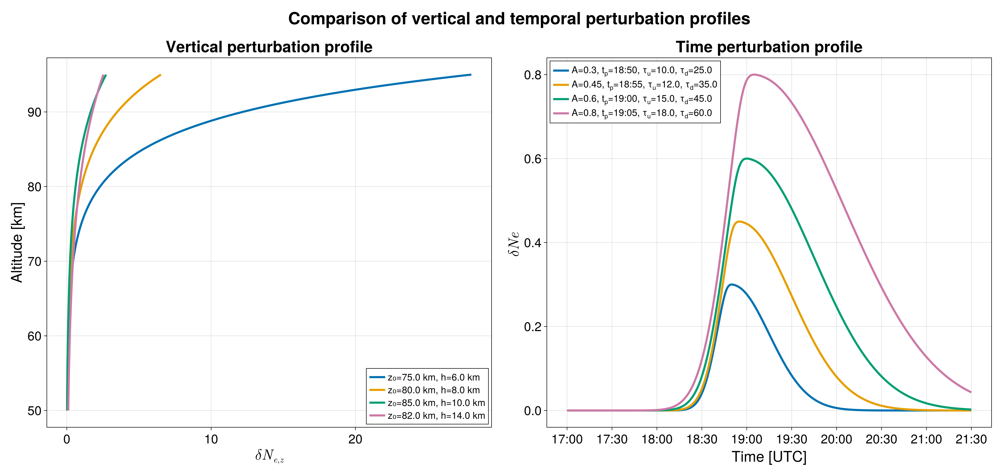

In [130]:
# ============================================================
# Figura 1x2:
#   Izquierda : perfil exponencial vertical para 4 sets de parámetros
#   Derecha   : F3(t) para 4 sets de parámetros, con eje X en HH:MM
# ============================================================

using Dates
using CairoMakie
using LaTeXStrings

# -----------------------------
# 1) Funciones
# -----------------------------
@inline nexp_profile(z_km, z0_km, hz_km) =
    exp(clamp((z_km - z0_km) / hz_km, -50.0, 50.0))

@inline function F3(t_min, amp, t_pk_min, tau_u_min, tau_d_min, eps_t_min)
    w = tau_u_min + 0.5 * (tau_d_min - tau_u_min) * (1.0 + tanh((t_min - t_pk_min) / eps_t_min))
    return amp * exp(-0.5 * ((t_min - t_pk_min) / w)^2)
end

# -----------------------------
# 2) Grillas
# -----------------------------
z_km = collect(50.0:0.1:95.0)
t_min = collect(-90.0:0.25:180.0)   # tiempo relativo en minutos respecto a t0_ref

# -----------------------------
# 3) Tiempo de referencia para etiquetar HH:MM
# -----------------------------
t0_ref = DateTime(2008, 3, 25, 18, 30, 0)

t_start = t0_ref + Minute(round(Int, minimum(t_min)))
t_end   = t0_ref + Minute(round(Int, maximum(t_min)))

tick_times_dt = collect(t_start:Minute(30):t_end)
xticks_pos = Dates.value.(tick_times_dt .- t0_ref) ./ 60000.0
xtick_labels = Dates.format.(tick_times_dt, "HH:MM")

# -----------------------------
# 4) Cuatro sets de parámetros
# -----------------------------
vertical_sets = [
    (z0 = 75.0, hz = 6.0),
    (z0 = 80.0, hz = 8.0),
    (z0 = 85.0, hz = 10.0),
    (z0 = 82.0, hz = 14.0),
]

f3_sets = [
    (amp = 0.30, t_pk = 20.0, tau_u = 10.0, tau_d = 25.0, eps_t = 4.0),
    (amp = 0.45, t_pk = 25.0, tau_u = 12.0, tau_d = 35.0, eps_t = 5.0),
    (amp = 0.60, t_pk = 30.0, tau_u = 15.0, tau_d = 45.0, eps_t = 6.0),
    (amp = 0.80, t_pk = 35.0, tau_u = 18.0, tau_d = 60.0, eps_t = 8.0),
]

# -----------------------------
# 5) Figura
# -----------------------------
fig = CairoMakie.Figure(size = (1900, 900))

CairoMakie.Label(
    fig[0, 1:2],
    "Comparison of vertical and temporal perturbation profiles",
    fontsize = 32,
    font = :bold,
    halign = :center,
    justification = :center,
    tellwidth = false
)

# -----------------------------
# Panel izquierdo
# -----------------------------
ax1 = CairoMakie.Axis(
    fig[1, 1],
    xlabel = L"\delta N_{e,z}",
    ylabel = "Altitude [km]",
    title = "Vertical perturbation profile",
    xlabelsize = 28,
    ylabelsize = 28,
    titlesize = 30,
    xticklabelsize = 24,
    yticklabelsize = 24,
    xgridvisible = true,
    ygridvisible = true
)

for p in vertical_sets
    CairoMakie.lines!(
        ax1,
        nexp_profile.(z_km, p.z0, p.hz),
        z_km,
        linewidth = 4,
        label = "z₀=$(p.z0) km, h=$(p.hz) km"
    )
end

CairoMakie.axislegend(
    ax1,
    position = :rb,
    labelsize = 18,
    patchsize = (30, 18),
    framevisible = true
)

# -----------------------------
# Panel derecho
# -----------------------------
ax2 = CairoMakie.Axis(
    fig[1, 2],
    xlabel = "Time [UTC]",
    ylabel = L"δNeₜ",
    title = "Time perturbation profile",
    xticks = (xticks_pos, xtick_labels),
    xlabelsize = 28,
    ylabelsize = 28,
    titlesize = 30,
    xticklabelsize = 24,
    yticklabelsize = 24,
    xgridvisible = true,
    ygridvisible = true
)

for p in f3_sets
    tpk_clock = Dates.format(t0_ref + Minute(round(Int, p.t_pk)), "HH:MM")
    CairoMakie.lines!(
        ax2,
        t_min,
        F3.(t_min, p.amp, p.t_pk, p.tau_u, p.tau_d, p.eps_t),
        linewidth = 4,
        #label = "A=$(p.amp), tₚ=$(tpk_clock), τᵤ=$(p.tau_u), τ_d=$(p.tau_d)"
        label = CairoMakie.rich("A=$(p.amp), t",CairoMakie.subscript("p"),"=$(tpk_clock), τ",CairoMakie.subscript("u"),
        "=$(p.tau_u), τ",CairoMakie.subscript("d"),"=$(p.tau_d)")
    )
end

CairoMakie.axislegend(
    ax2,
    position = :lt,
    labelsize = 18,
    patchsize = (30, 18),
    framevisible = true
)

CairoMakie.colgap!(fig.layout, 30)
save("different-perturbation-parameters.pdf",fig)

fig

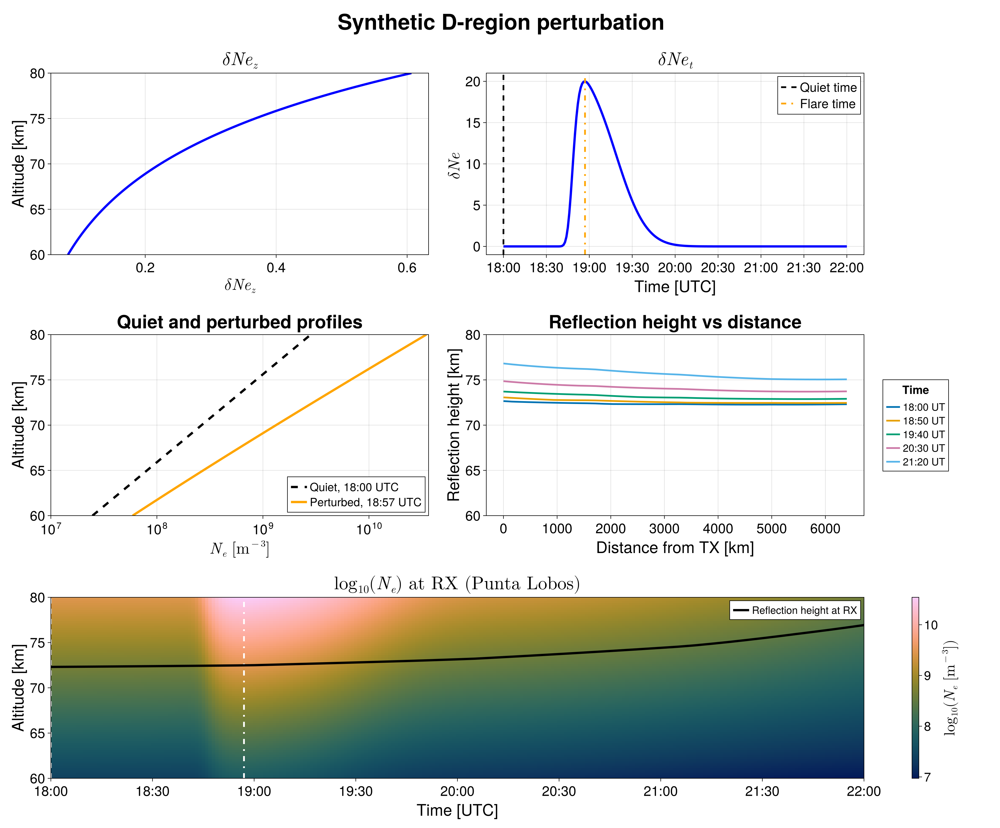

In [175]:
# ============================================================
# Figura modificada de 3 filas:
#   CAMBIOS pedidos:
#   - Todas las alturas: 60–80 km
#   - Menos tiempos en "Reflection height vs distance" (la mitad)
#   - Curva de reflection height en el gráfico 2D: color negro
#   - Heatmap en escala log10(Ne), sin dividir por 1e12
# ============================================================

using HDF5
using Dates
using TimeZones
using AstroLib
using Polynomials
using CairoMakie
using LaTeXStrings

# ------------------------------------------------------------
# 0) Asegurar funciones del proyecto si no están cargadas
# ------------------------------------------------------------
PROJECT_ROOT_LOCAL = isdefined(Main, :PROJECT_ROOT) ? PROJECT_ROOT : pwd()
preamble_path = joinpath(PROJECT_ROOT_LOCAL, "mytools", "preamble.jl")

if (!isdefined(Main, :waitprofile) || !isdefined(Main, :geolinspace)) && isfile(preamble_path)
    include(preamble_path)
end

@assert isdefined(Main, :waitprofile) "No encuentro `waitprofile`."
@assert isdefined(Main, :geolinspace) "No encuentro `geolinspace`."

@assert isdefined(Main, :mat_refHeights) "No existe `mat_refHeights` en memoria."
@assert isdefined(Main, :zdt_test1) "No existe `zdt_test1` en memoria."
@assert isdefined(Main, :dists) "No existe `dists` en memoria."

@assert size(mat_refHeights, 1) == length(zdt_test1) "size(mat_refHeights,1) no coincide con length(zdt_test1)."
@assert size(mat_refHeights, 2) == length(dists) "size(mat_refHeights,2) no coincide con length(dists)."

# ------------------------------------------------------------
# 1) Cargar archivo .h5 sintético
# ------------------------------------------------------------
h5_candidates = [
    "synthetic_F3_nexp_seed_fine2.h5",
    joinpath(PROJECT_ROOT_LOCAL, "synthetic_F3_nexp_seed_fine2.h5")
]

existing_h5 = filter(isfile, h5_candidates)
@assert !isempty(existing_h5) "No encontré synthetic_F3_nexp_seed_fine2.h5."

filename_syn = existing_h5[1]

timestamps = Float64.(h5read(filename_syn, "timestamps"))
pars_syn   = Float64.(h5read(filename_syn, "pars_syn"))

coeffs_h_alb    = Float64.(h5read(filename_syn, "coeffs_h_alb"))
coeffs_beta_alb = Float64.(h5read(filename_syn, "coeffs_beta_alb"))

@assert length(pars_syn) == 7 "pars_syn debe tener 7 parámetros."

amp_f3, t_pk_f3, tau_u_f3, tau_d_f3, eps_f3, z0_km, hz_km = pars_syn

# ------------------------------------------------------------
# 2) Funciones F3 + perturbación vertical
# ------------------------------------------------------------
@inline nexp_profile_plot(z_km::Real, z0::Real, hz::Real) =
    exp(clamp((z_km - z0) / hz, -50.0, 50.0))

@inline function gauss_asym_F3_plot(
    dt_s::Real,
    amp::Real,
    t_pk::Real,
    tau_u::Real,
    tau_d::Real,
    eps_t::Real
)
    w = tau_u + 0.5 * (tau_d - tau_u) * (1.0 + tanh((dt_s - t_pk) / eps_t))
    return amp * exp(-0.5 * ((dt_s - t_pk) / w)^2)
end

@inline function ne_perturbed_plot(
    z_m::Real,
    hprime_km::Real,
    beta_km_inv::Real,
    dt_s::Real,
    amp::Real,
    t_pk::Real,
    tau_u::Real,
    tau_d::Real,
    eps_t::Real,
    z0::Real,
    hz::Real
)
    ne_bg = waitprofile(z_m, hprime_km, beta_km_inv)
    z_km_local = z_m / 1e3

    return ne_bg * (
        1.0 +
        nexp_profile_plot(z_km_local, z0, hz) *
        gauss_asym_F3_plot(dt_s, amp, t_pk, tau_u, tau_d, eps_t)
    )
end

# ------------------------------------------------------------
# 3) Tiempo sintético
# ------------------------------------------------------------
time_dt  = Dates.unix2datetime.(timestamps)
time_zdt = ZonedDateTime.(time_dt, tz"UTC")

t0_ref  = ZonedDateTime(2008, 3, 25, 18, 30, 0, tz"UTC")
t0_unix = Dates.datetime2unix(DateTime(t0_ref))

dt_seconds = timestamps .- t0_unix
time_hours = (timestamps .- first(timestamps)) ./ 3600.0

tini = ceil(first(time_dt), Minute(30))
tfin = floor(last(time_dt), Minute(30))
xticks_dt = collect(tini:Minute(30):tfin)

xticks_hours = (Dates.datetime2unix.(xticks_dt) .- first(timestamps)) ./ 3600.0
xtick_labels = Dates.format.(xticks_dt, "HH:MM")

# ------------------------------------------------------------
# 4) Tiempo de mat_refHeights
# ------------------------------------------------------------
ref_unix = [
    Dates.datetime2unix(DateTime(astimezone(tt, tz"UTC")))
    for tt in zdt_test1
]

ref_time_hours = (ref_unix .- first(timestamps)) ./ 3600.0

# ------------------------------------------------------------
# 5) mat_refHeights a km
# ------------------------------------------------------------
mat_refHeights_km = maximum(abs.(mat_refHeights)) > 1e3 ? mat_refHeights ./ 1e3 : mat_refHeights
refheight_rx_km = mat_refHeights_km[:, end]

# ------------------------------------------------------------
# 6) Tiempos seleccionados para reflection height vs distance
#    (la mitad de los que había antes)
# ------------------------------------------------------------
sample_times_dt_full = collect(
    DateTime(2008, 3, 25, 18, 0, 0):Minute(25):DateTime(2008, 3, 25, 21, 45, 0)
)
sample_times_dt = sample_times_dt_full[1:2:end]   # mitad

sample_idx_ref = [
    argmin(abs.(ref_unix .- Dates.datetime2unix(ti)))
    for ti in sample_times_dt
]

sample_labels = Dates.format.(DateTime.(astimezone.(zdt_test1[sample_idx_ref], tz"UTC")), "HH:MM") .* " UT"

# ------------------------------------------------------------
# 7) Geometría para el mapa altura-tiempo
# ------------------------------------------------------------
npoints_plot = 19
lats_new_plot, lons_new_plot, dists_new_plot = geolinspace("NAA", "PLO", npoints_plot, false)

lat_ref = lats_new_plot[end]
lon_ref = lons_new_plot[end]

dists_ref = Float64.(dists)
dist_factor = maximum(abs.(dists_ref)) > 1e5 ? 1e-3 : 1.0
dists_ref_km = dists_ref .* dist_factor

# ------------------------------------------------------------
# 8) Ángulo solar zenital firmado
# ------------------------------------------------------------
function chi_signed_astrolib_plot(
    lat_deg::Real,
    lon_deg::Real,
    zdt::ZonedDateTime;
    height_m::Real = 0.0,
    units::Symbol = :deg
)
    zdt_utc = astimezone(zdt, tz"UTC")
    jd = AstroLib.jdcnv(DateTime(zdt_utc))

    ra, dec = AstroLib.sunpos(jd)
    alt_deg, az_deg, _ha_deg = AstroLib.eq2hor(
        ra, dec, jd, lat_deg, lon_deg, height_m
    )

    sza = 90.0 - alt_deg
    chi_deg = (0.0 <= az_deg < 180.0) ? -sza : +sza

    return units === :rad ? deg2rad(chi_deg) : chi_deg
end

p_h_alb    = Polynomial(coeffs_h_alb)
p_beta_alb = Polynomial(coeffs_beta_alb)

# ------------------------------------------------------------
# 9) Grillas de altura: TODO entre 60 y 80 km
# ------------------------------------------------------------
z_grid_km_left = collect(60.0:0.25:80.0)

z_grid_km_map = collect(60.0:0.25:80.0)
z_grid_m_map  = z_grid_km_map .* 1e3

Nt = length(time_zdt)
Nz = length(z_grid_km_map)

Ne_ht = Matrix{Float64}(undef, Nt, Nz)

for k in 1:Nt
    chi_deg = chi_signed_astrolib_plot(lat_ref, lon_ref, time_zdt[k])
    chi_rad = deg2rad(chi_deg)

    hprime_val = p_h_alb(chi_rad)
    beta_val   = p_beta_alb(chi_rad)

    for j in 1:Nz
        Ne_ht[k, j] = ne_perturbed_plot(
            z_grid_m_map[j],
            hprime_val,
            beta_val,
            dt_seconds[k],
            amp_f3,
            t_pk_f3,
            tau_u_f3,
            tau_d_f3,
            eps_f3,
            z0_km,
            hz_km
        )
    end
end

# Para perfiles: Ne / 1e12
Ne_ht_scaled = Ne_ht #./ 1e12

# Para heatmap: Ne crudo en escala log10
positive_Ne = Ne_ht[Ne_ht .> 0.0]
@assert !isempty(positive_Ne) "Ne_ht no tiene valores positivos para aplicar log10."

Ne_floor = minimum(positive_Ne)
Ne_ht_log10 = log10.(max.(Ne_ht, Ne_floor))

# ------------------------------------------------------------
# 10) Curvas 1D
# ------------------------------------------------------------
nexp_vals = nexp_profile_plot.(z_grid_km_left, z0_km, hz_km)

F3_vals = gauss_asym_F3_plot.(
    dt_seconds,
    amp_f3,
    t_pk_f3,
    tau_u_f3,
    tau_d_f3,
    eps_f3
)

# ------------------------------------------------------------
# 11) Elegir cortes verticales de Ne(h)
# ------------------------------------------------------------
idx_peak = argmax(F3_vals)

quiet_candidates = findall(F3_vals .<= 0.01 * maximum(F3_vals))
idx_quiet = isempty(quiet_candidates) ? argmin(F3_vals) : first(quiet_candidates)

quiet_time_label = Dates.format(time_dt[idx_quiet], "HH:MM")
peak_time_label  = Dates.format(time_dt[idx_peak], "HH:MM")

Ne_quiet_profile = Ne_ht_scaled[idx_quiet, :]
Ne_peak_profile  = Ne_ht_scaled[idx_peak, :]

positive_profiles = vcat(
    Ne_quiet_profile[Ne_quiet_profile .> 0.0],
    Ne_peak_profile[Ne_peak_profile .> 0.0]
)

@assert !isempty(positive_profiles) "Los perfiles tienen valores no positivos."

profile_xmin_log = 10.0 ^ floor(log10(minimum(positive_profiles)))
profile_xmax_all = 1.05 * maximum(vcat(Ne_quiet_profile, Ne_peak_profile))

# ------------------------------------------------------------
# 12) reflection height vs distance usando mat_refHeights
# ------------------------------------------------------------
refheight_vs_dist_selected = mat_refHeights_km[sample_idx_ref, :]

# ------------------------------------------------------------
# 13) Figura final
# ------------------------------------------------------------
fig = CairoMakie.Figure(size = (1750, 1450))

CairoMakie.Label(
    fig[0, 1:3],
    "Synthetic D-region perturbation",
    fontsize = 38,
    font = :bold,
    halign = :center,
    justification = :center,
    tellwidth = false
)

# -----------------------------
# Fila 1, columna 1: perturbación vertical
# -----------------------------
ax_z = CairoMakie.Axis(
    fig[1, 1],
    xlabel = L"\delta Ne_{z}",
    ylabel = "Altitude [km]",
    title = L"\delta Ne_z",
    limits = (nothing, (60.0, 80.0)),
    xlabelsize = 28,
    ylabelsize = 28,
    titlesize = 32,
    xticklabelsize = 24,
    yticklabelsize = 24,
    xgridvisible = true,
    ygridvisible = true,
)

CairoMakie.lines!(ax_z, nexp_vals, z_grid_km_left, linewidth = 4,color =:blue)

# -----------------------------
# Fila 1, columna 2: perturbación temporal
# -----------------------------
ax_t = CairoMakie.Axis(
    fig[1, 2],
    xlabel = "Time [UTC]",
    ylabel = L"δNeₜ",
    title = L"\delta Ne_t",
    xticks = (xticks_hours, xtick_labels),
    xlabelsize = 28,
    ylabelsize = 28,
    titlesize = 32,
    xticklabelsize = 24,
    yticklabelsize = 24,
    xgridvisible = true,
    ygridvisible = true,
)

CairoMakie.lines!(ax_t, time_hours, F3_vals, linewidth = 4,color =:blue)

CairoMakie.vlines!(
    ax_t,
    [time_hours[idx_quiet]],
    linestyle = :dash,
    linewidth = 3,
    label = "Quiet time",
    color=:black
)

CairoMakie.vlines!(
    ax_t,
    [time_hours[idx_peak]],
    linestyle = :dashdot,
    linewidth = 3,
    label = "Flare time",
    color=:orange
)

CairoMakie.axislegend(ax_t, position = :rt, labelsize = 22, patchsize = (28, 18))

# -----------------------------
# Fila 2, columna 1: quiet + perturbed profiles
# -----------------------------
ax_prof = CairoMakie.Axis(
    fig[2, 1],
    xlabel = L"N_e\ [\mathrm{m}^{-3}]",
    ylabel = "Altitude [km]",
    title = "Quiet and perturbed profiles",
    xscale = log10,
    limits = ((profile_xmin_log, profile_xmax_all), (60.0, 80.0)),
    xlabelsize = 28,
    ylabelsize = 28,
    titlesize = 32,
    xticklabelsize = 24,
    yticklabelsize = 24,
    xgridvisible = true,
    ygridvisible = true
)

CairoMakie.lines!(
    ax_prof,
    Ne_quiet_profile,
    z_grid_km_map,
    linewidth = 4,
    linestyle = :dash,
    color = :black,
    label = "Quiet, $(quiet_time_label) UTC",
    
)

CairoMakie.lines!(
    ax_prof,
    Ne_peak_profile,
    z_grid_km_map,
    linewidth = 4,
    color = :orange,
    label = "Perturbed, $(peak_time_label) UTC"
)

CairoMakie.axislegend(
    ax_prof,
    position = :rb,
    labelsize = 20,
    patchsize = (28, 18),
    framevisible = true
)

# -----------------------------
# Fila 2, columna 2: reflection height vs distance
# -----------------------------
ax_refdist = CairoMakie.Axis(
    fig[2, 2],
    xlabel = "Distance from TX [km]",
    ylabel = "Reflection height [km]",
    title = "Reflection height vs distance",
    limits = (nothing, (60.0, 80.0)),
    xlabelsize = 28,
    ylabelsize = 28,
    titlesize = 32,
    xticklabelsize = 24,
    yticklabelsize = 24,
    xgridvisible = true,
    ygridvisible = true
)

for it in 1:length(sample_idx_ref)
    CairoMakie.lines!(
        ax_refdist,
        dists_ref_km,
        refheight_vs_dist_selected[it, :],
        linewidth = 3,
        label = sample_labels[it]
    )
end

CairoMakie.Legend(
    fig[2, 3],
    ax_refdist,
    "Time",
    labelsize = 18,
    titlesize = 20,
    patchsize = (24, 14),
    framevisible = true
)

# -----------------------------
# Fila 3: mapa 2D log10(Ne) + curva negra de reflection height en RX
# -----------------------------
ax_map = CairoMakie.Axis(
    fig[3, 1:2],
    xlabel = "Time [UTC]",
    ylabel = "Altitude [km]",
    title = L"\log_{10}(N_e)\ \mathrm{at\ RX\ (Punta\ Lobos)}",
    xticks = (xticks_hours, xtick_labels),
    limits = (minimum(time_hours), maximum(time_hours), 60.0, 80.0),
    xlabelsize = 28,
    ylabelsize = 28,
    titlesize = 32,
    xticklabelsize = 24,
    yticklabelsize = 24,
    xgridvisible = false,
    ygridvisible = false
)

hm = CairoMakie.heatmap!(
    ax_map,
    time_hours,
    z_grid_km_map,
    Ne_ht_log10;
    colormap = :batlow,#:viridis,
    colorrange = (minimum(Ne_ht_log10), maximum(Ne_ht_log10))
)

CairoMakie.vlines!(
    ax_map,
    [time_hours[idx_quiet]],
    color = :white,
    linestyle = :dash,
    linewidth = 3
)

CairoMakie.vlines!(
    ax_map,
    [time_hours[idx_peak]],
    color = :white,
    linestyle = :dashdot,
    linewidth = 3
)

# Curva negra de reflection height en RX
CairoMakie.lines!(
    ax_map,
    ref_time_hours,
    refheight_rx_km,
    color = :black,
    linewidth = 4,
    label = "Reflection height at RX"
)

CairoMakie.axislegend(
    ax_map,
    position = :rt,
    labelsize = 18,
    patchsize = (28, 18),
    framevisible = true
)

CairoMakie.Colorbar(
    fig[3, 3],
    hm,
    label = L"\log_{10}(N_e\ [\mathrm{m}^{-3}])",
    labelsize = 26,
    ticklabelsize = 22
)

# -----------------------------
# Layout
# -----------------------------
CairoMakie.colgap!(fig.layout, 28)
CairoMakie.rowgap!(fig.layout, 28)

CairoMakie.colsize!(fig.layout, 1, CairoMakie.Auto(1))
CairoMakie.colsize!(fig.layout, 2, CairoMakie.Auto(1))
CairoMakie.colsize!(fig.layout, 3, CairoMakie.Fixed(125))

save("synthetic-perturbation-d-region_logNe_60to80km.pdf", fig)

fig

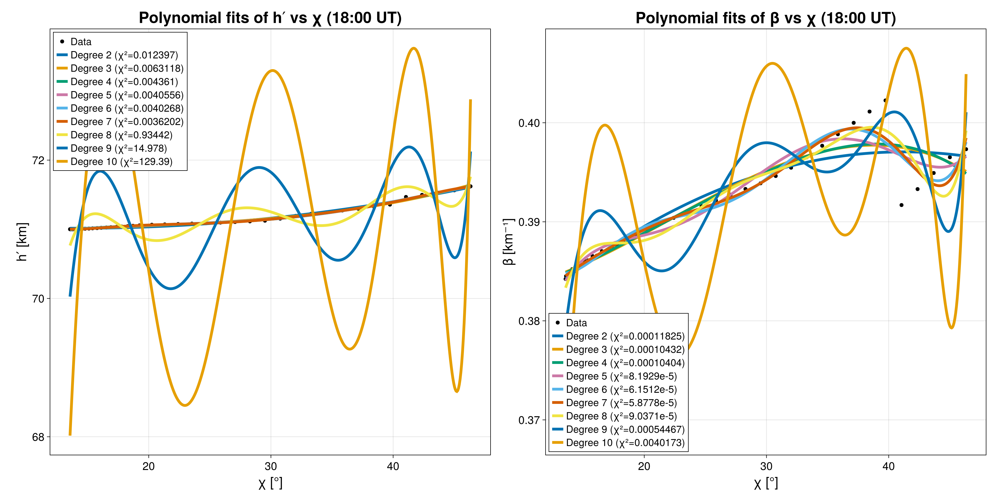

In [41]:
using CairoMakie
using LinearAlgebra
using Dates

# ============================================================
# Configuración
# ============================================================
it_fit  = 1
degrees = 2:10

lw = 5
ms = 10

fs_tick   = 20
fs_label  = 24
fs_title  = 28
fs_legend = 18

# ============================================================
# Datos del instante elegido
# ============================================================
chi_all   = Float64.(vec(mat_sza_test1[it_fit, :]))
hp_all    = Float64.(vec(mat_hs[it_fit, :]))
beta_all  = Float64.(vec(mat_βs[it_fit, :]))

mask_hp   = isfinite.(chi_all) .& isfinite.(hp_all)
mask_beta = isfinite.(chi_all) .& isfinite.(beta_all)

chi_hp = chi_all[mask_hp]
hp_obs = hp_all[mask_hp]

chi_beta = chi_all[mask_beta]
beta_obs = beta_all[mask_beta]

perm_hp   = sortperm(chi_hp)
perm_beta = sortperm(chi_beta)

chi_hp = chi_hp[perm_hp]
hp_obs = hp_obs[perm_hp]

chi_beta = chi_beta[perm_beta]
beta_obs = beta_obs[perm_beta]

chi_grid_hp   = collect(range(minimum(chi_hp), maximum(chi_hp), length=500))
chi_grid_beta = collect(range(minimum(chi_beta), maximum(chi_beta), length=500))

# ============================================================
# Helpers
# ============================================================
poly_design(x, deg) = hcat([x.^k for k in 0:deg]...)

function poly_fit_coeffs(x, y, deg)
    X = poly_design(x, deg)
    return X \ y
end

function poly_eval(coeffs, x)
    y = zeros(Float64, length(x))
    for k in eachindex(coeffs)
        y .+= coeffs[k] .* x.^(k - 1)
    end
    return y
end

chi2_standard(y, yfit) = sum((y .- yfit).^2)

# ============================================================
# Figura
# ============================================================
tlabel = Dates.format(zdt_test1[it_fit], "HH:MM") * " UT"

fig = CairoMakie.Figure(
    size = (1800, 900),
    fontsize = fs_label,
    figure_padding = (25, 25, 20, 15)
)

ax_hp = CairoMakie.Axis(
    fig[1, 1],
    xlabel = "χ [°]",
    ylabel = "h′ [km]",
    title  = "Polynomial fits of h′ vs χ ($tlabel)",
    xlabelsize = fs_label,
    ylabelsize = fs_label,
    titlesize  = fs_title,
    xticklabelsize = fs_tick,
    yticklabelsize = fs_tick,
    xgridvisible = true,
    ygridvisible = true
)

ax_beta = CairoMakie.Axis(
    fig[1, 2],
    xlabel = "χ [°]",
    ylabel = "β [km⁻¹]",
    title  = "Polynomial fits of β vs χ ($tlabel)",
    xlabelsize = fs_label,
    ylabelsize = fs_label,
    titlesize  = fs_title,
    xticklabelsize = fs_tick,
    yticklabelsize = fs_tick,
    xgridvisible = true,
    ygridvisible = true
)

CairoMakie.scatter!(ax_hp, chi_hp, hp_obs, color = :black, markersize = ms, label = "Data")
CairoMakie.scatter!(ax_beta, chi_beta, beta_obs, color = :black, markersize = ms, label = "Data")

for deg in degrees
    coeffs_hp   = poly_fit_coeffs(chi_hp, hp_obs, deg)
    hp_fit_obs  = poly_eval(coeffs_hp, chi_hp)
    hp_fit_grid = poly_eval(coeffs_hp, chi_grid_hp)
    chi2_hp     = chi2_standard(hp_obs, hp_fit_obs)

    CairoMakie.lines!(
        ax_hp,
        chi_grid_hp,
        hp_fit_grid,
        linewidth = lw,
        label = "Degree $deg (χ²=$(round(chi2_hp, sigdigits=5)))"
    )

    coeffs_beta   = poly_fit_coeffs(chi_beta, beta_obs, deg)
    beta_fit_obs  = poly_eval(coeffs_beta, chi_beta)
    beta_fit_grid = poly_eval(coeffs_beta, chi_grid_beta)
    chi2_beta     = chi2_standard(beta_obs, beta_fit_obs)

    CairoMakie.lines!(
        ax_beta,
        chi_grid_beta,
        beta_fit_grid,
        linewidth = lw,
        label = "Degree $deg (χ²=$(round(chi2_beta, sigdigits=5)))"
    )
end

CairoMakie.axislegend(ax_hp, position = :lt, labelsize = fs_legend, framevisible = true)
CairoMakie.axislegend(ax_beta, position = :lb, labelsize = fs_legend, framevisible = true)

fig